## Load data

In [1]:
data_dir = 'C:/Data/Antonio/Philip/081114Patch clamp/nanorods 630/fov1/114640_take1 100Hz'

In [2]:
from __future__ import division
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
import numpy as np
import scipy.ndimage as ndi
sns.set_context(rc={'lines.markeredgewidth': 1})  # workaround for a bug in matplotlib 1.4.2

In [3]:
from IPython.core.display import HTML
HTML(open("./styles/custom2.css", "r").read())

In [4]:
from figscroller import FrameScroller, HorizontalScroller
from patchclamp import PatchDataset
import timetraces as tt

In [5]:
data = PatchDataset(data_dir)

In [6]:
data.params['Square frame rate (Hz)']

400.0

The attributes `data.voltage/current/time` are resampled at the camera frame rate:

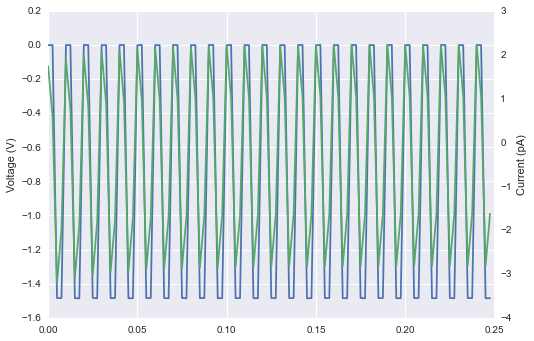

In [7]:
plt.plot(data.time[:100], data.voltage[:100], label='Voltage')
plt.ylabel('Voltage (V)')
plt.twinx()
plt.plot(data.time[:100], data.current[:100], label='Current',
         color=sns.color_palette()[1])
plt.ylabel('Current (pA)')
plt.grid(False)
plt.xlabel('Time (s)')

In [8]:
sns.set_style('dark')

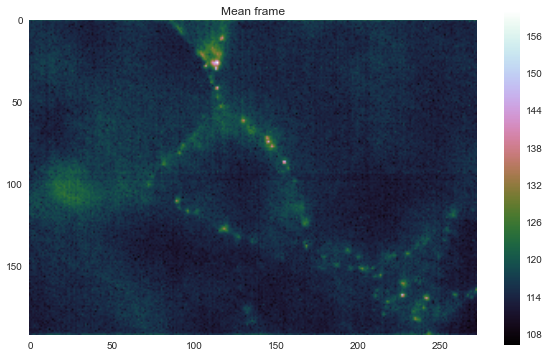

In [9]:
fig, ax = plt.subplots(figsize=(10, 6))
im = ax.imshow(data.video.mean(0), cmap='cubehelix')
plt.colorbar(im);
ax.set_title('Mean frame')

# Video Filtering

## Mean frame

In [10]:
mvideo = data.video.mean(0)
mvideo.shape, mvideo.dtype

((192L, 272L), dtype('float64'))

In [11]:
mvideo_highpass = mvideo - ndi.gaussian_filter(mvideo, sigma=8)
th = mvideo_highpass > 0.4*mvideo_highpass.max()

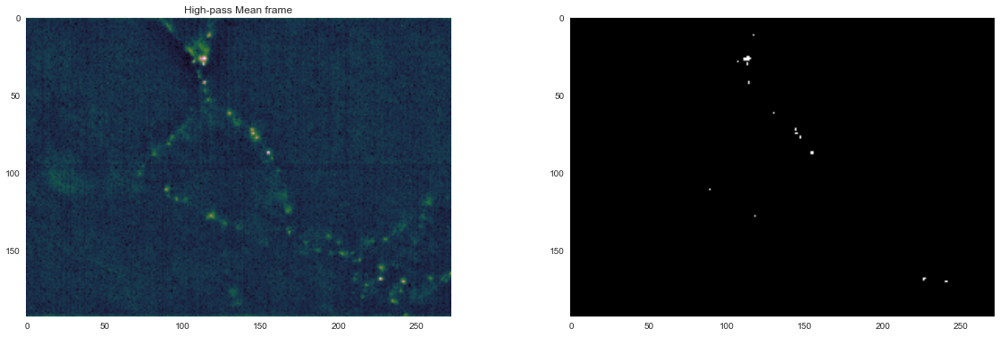

In [12]:
fig, ax = plt.subplots(1, 2, figsize=(20, 6))
im = ax[0].imshow(mvideo_highpass, cmap='cubehelix')
#plt.colorbar(im);
im = ax[1].imshow(th, cmap='cubehelix')
ax[0].set_title('High-pass Mean frame')

## Full-video

In [13]:
video_highpass = data.video - ndi.gaussian_filter(data.video.astype('float'), sigma=(6, 6, 10))
# video_highpass.shape, video_highpass.dtype

# fig, ax = plt.subplots(figsize=(10, 6))
# im = ax.imshow(video_highpass.mean(0), cmap='cubehelix')
# plt.colorbar(im);
# ax.set_title('Mean frame after HPF')

In [14]:
video_highpass.shape

(1996L, 192L, 272L)

In [15]:
data.video.mean(), video_highpass.mean()

(115.14464272448082, -9.3453705835467859e-14)

In [16]:
video_highpass_tm = video_highpass - video_highpass.mean(axis=0)
video_highpass_tm.shape, video_highpass_tm.dtype

((1996L, 192L, 272L), dtype('float64'))

In [17]:
video_highpass_on = np.zeros(data.video.shape[1:])
for row in range(data.video.shape[1]):
    for col in range(data.video.shape[2]):
        on_periods = video_highpass_tm[:, row, col] > 0
        video_highpass_on[row, col] = video_highpass_tm[on_periods, row, col].mean()
video_highpass_on.shape, video_highpass_on.dtype

((192L, 272L), dtype('float64'))

In [18]:
hp_frame = ndi.gaussian_filter(video_highpass_on, sigma=0.3)

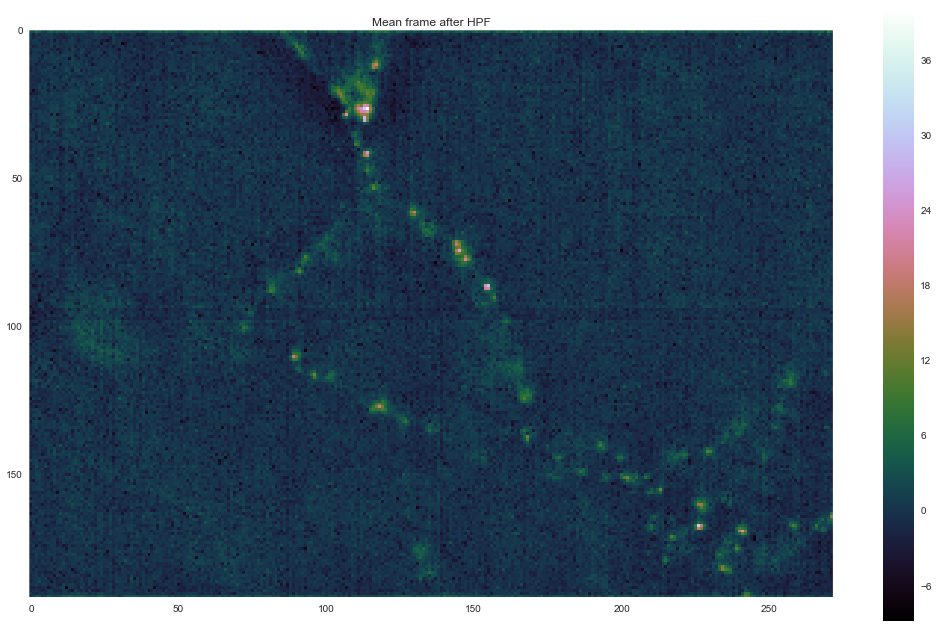

In [19]:
fig, ax = plt.subplots(figsize=(18, 11))
im = ax.imshow(video_highpass.mean(0), cmap='cubehelix', interpolation='none')
plt.colorbar(im);
ax.set_title('Mean frame after HPF');

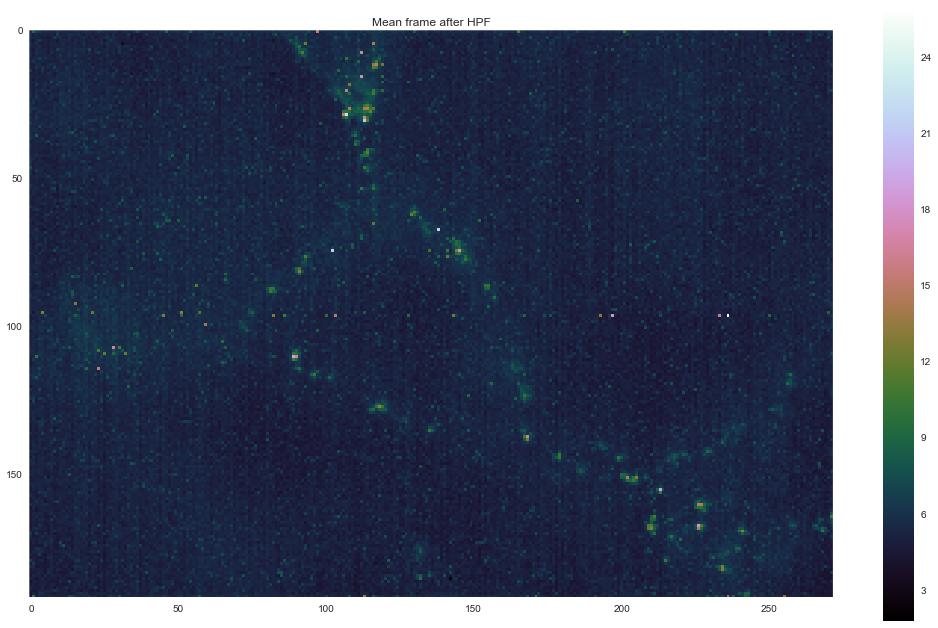

In [20]:
fig, ax = plt.subplots(figsize=(18, 11))
im = ax.imshow(video_highpass_on, cmap='cubehelix', interpolation='none')
plt.colorbar(im);
ax.set_title('Mean frame after HPF');

## Select QD positions

In [21]:
# %matplotlib qt
# sns.set_style('dark')

Explore the video frame by frame:

In [22]:
# fig, ax = plt.subplots(figsize=(14, 9))
# im = ax.imshow(data.video.mean(0), cmap='cubehelix', interpolation='none')
# plt.colorbar(im)

# scroller = FrameScroller(fig, im, data.video)
# points = plt.ginput(10, timeout=0)
# points

In [23]:
# fig, ax = plt.subplots(figsize=(14, 9))
# im = ax.imshow(frame, cmap='cubehelix', interpolation='none')
# plt.colorbar(im)
# points = plt.ginput(10, timeout=0)
# points

Or use only the mean frame:

In [24]:
# fig, ax = plt.subplots(figsize=(14, 9))
# im = ax.imshow(frame, cmap='cubehelix')
# plt.colorbar(im)
# #points = plt.ginput(10, timeout=0)
# #points

**QD on patched cell:**

In [25]:
frame = data.video.mean(0)

In [26]:
%matplotlib inline
sns.set_style('dark')

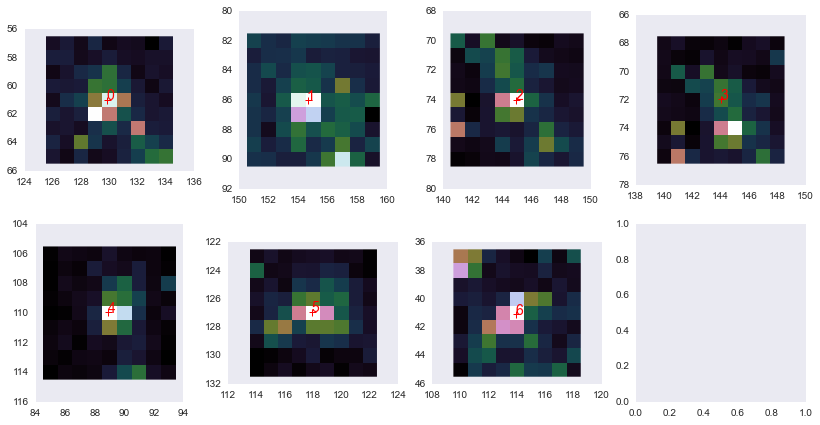

In [27]:
points_patched = \
    [(129.84400198396881, 60.998118646576899),
     (154.63469015102521, 86.020150644805398),
     (144.95690265150074, 73.968566211435302),
     (144.04390383079087, 71.959968805873615),
     (88.898775059915508, 109.94071974740365),
     (117.93213755848896, 126.92249781260698),
     (113.91494274736559, 41.100608665880458),
]    
nrows = 2
npoints = len(points_patched)
even_npoints = npoints if npoints % 2 == 0 else npoints + 1
ncols = even_npoints // 2

fig, ax = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3.5*nrows))
axr = ax.ravel()
for ip, point in enumerate(points_patched):
    rpoint = np.round(point)
    roi = tt.get_roi_square(rpoint, pad=4)
    axr[ip].imshow(hp_frame[roi], cmap='cubehelix', interpolation='none',
                   extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    axr[ip].plot(point[0], point[1], 'r+')
    axr[ip].annotate('%d' % ip, point, color='red', fontsize=14)

**QD unpatched:**

In [28]:
%matplotlib inline
sns.set_style('dark')

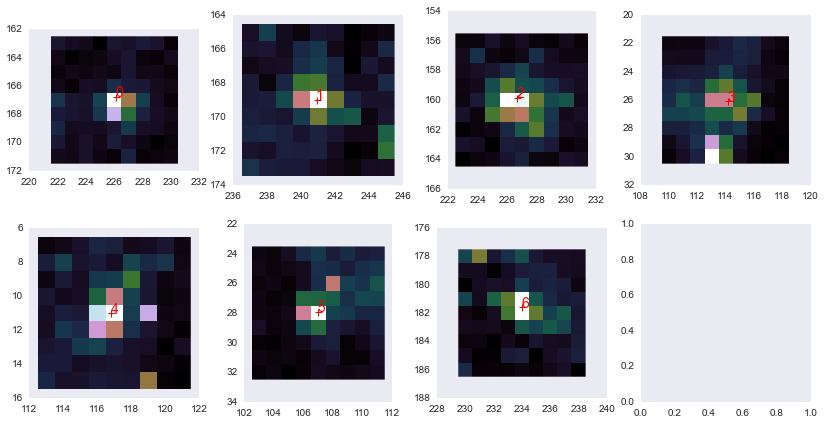

In [29]:
points_unpatched = \
    [(226.12893521850839, 166.78365250387941),
     (240.92794772704292, 168.97609880144006),
     (226.67704679289855, 159.84090589493726),
     (114.13147018478396, 26.101681743736179),
     (116.8, 11.0),
     (107.00601971771177, 27.92872032503675),
     (234, 181.6),
    ]
    
nrows = 2
npoints = len(points_unpatched)
even_npoints = npoints if npoints % 2 == 0 else npoints + 1
ncols = even_npoints // 2

fig, ax = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3.5*nrows))
axr = ax.ravel()
for ip, point in enumerate(points_unpatched):
    rpoint = np.round(point)
    roi = tt.get_roi_square(rpoint, pad=4)
    axr[ip].imshow(hp_frame[roi], cmap='cubehelix', interpolation='none',
                   extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    axr[ip].plot(point[0], point[1], 'r+')
    axr[ip].annotate('%d' % ip, point, color='red', fontsize=14)

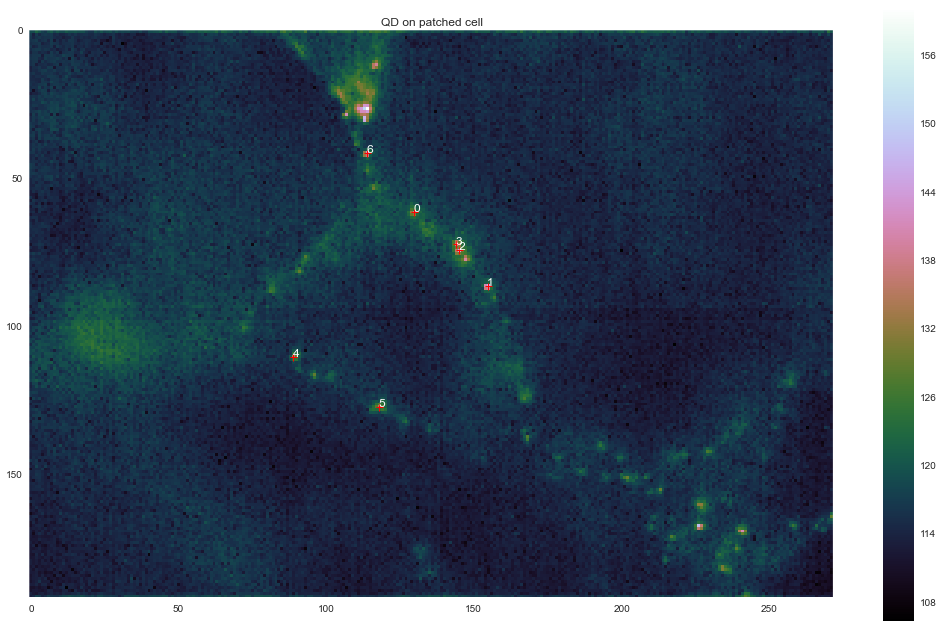

In [30]:
fig, ax = plt.subplots(figsize=(18, 11))
for ip, point in enumerate(points_patched):
    plt.plot(point[0], point[1], 'r+')
    plt.annotate('%d' % ip, point, color='white', fontsize=12)
im = ax.imshow(data.video.mean(0), cmap='cubehelix', interpolation='none')
plt.colorbar(im);
ax.set_title('QD on patched cell')

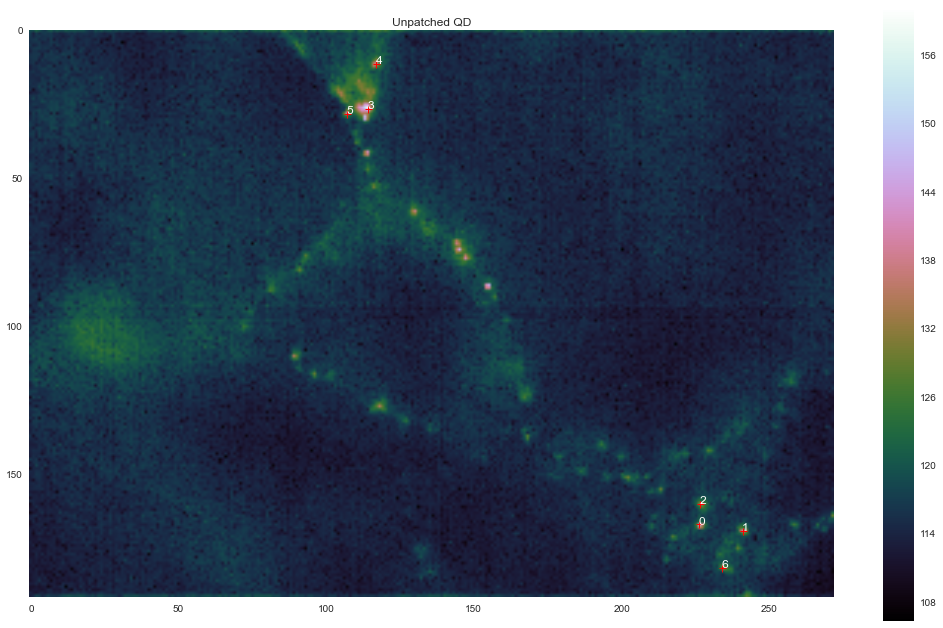

In [31]:
fig, ax = plt.subplots(figsize=(18, 11))
for ip, point in enumerate(points_unpatched):
    plt.plot(point[0], point[1], 'r+')
    plt.annotate('%d' % ip, point, color='white', fontsize=12)
im = ax.imshow(data.video.mean(0), cmap='cubehelix')
plt.colorbar(im);
ax.set_title('Unpatched QD');

## Timetrace extraction

Timetrace can be extracted by averaging a **square** or a **circle** of pixels:

## Test round ROI

In [32]:
sns.set_style('darkgrid')

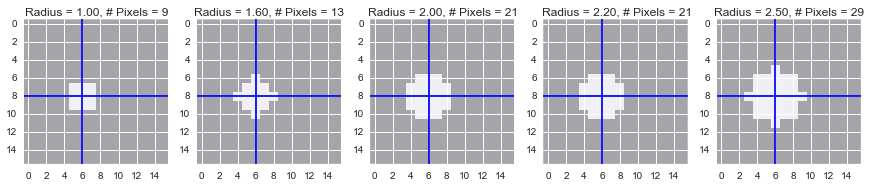

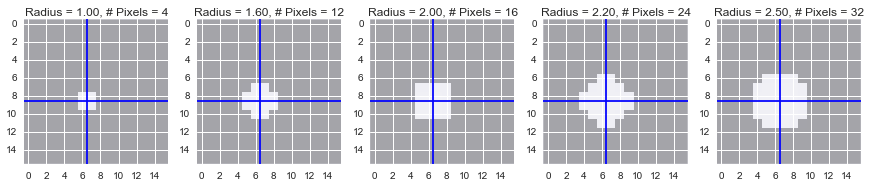

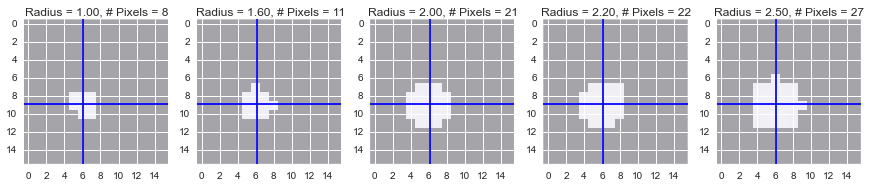

In [33]:
shape2d = (16, 16)
radii = [1, 1.6, 2, 2.2, 2.5]
point = (6, 8)

fig, ax = plt.subplots(1, len(radii), figsize=(3*len(radii), 3))
for i, clip_radius in enumerate(radii):
    mask = tt.get_roi_circle(point, clip_radius, shape2d)
    a = np.zeros(shape2d)
    a[mask] = 1
    im = ax[i].imshow(a, interpolation='none', cmap='gray', alpha=0.3)
    ax[i].axvline(point[0])
    ax[i].axhline(point[1])
    ax[i].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))
    
point = (point[0]+0.5, point[1]+0.5)
fig, ax = plt.subplots(1, len(radii), figsize=(3*len(radii), 3))
for i, clip_radius in enumerate(radii):
    mask = tt.get_roi_circle(point, clip_radius, shape2d)
    a = np.zeros(shape2d)
    a[mask] = 1
    im = ax[i].imshow(a, interpolation='none', cmap='gray', alpha=0.3)
    ax[i].axvline(point[0])
    ax[i].axhline(point[1])
    ax[i].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))

point = (point[0]-0.4, point[1]+0.4)
fig, ax = plt.subplots(1, len(radii), figsize=(3*len(radii), 3))
for i, clip_radius in enumerate(radii):
    mask = tt.get_roi_circle(point, clip_radius, shape2d)
    a = np.zeros(shape2d)
    a[mask] = 1
    im = ax[i].imshow(a, interpolation='none', cmap='gray', alpha=0.3)
    ax[i].axvline(point[0])
    ax[i].axhline(point[1])
    ax[i].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))

In [34]:
sns.set_style('dark')

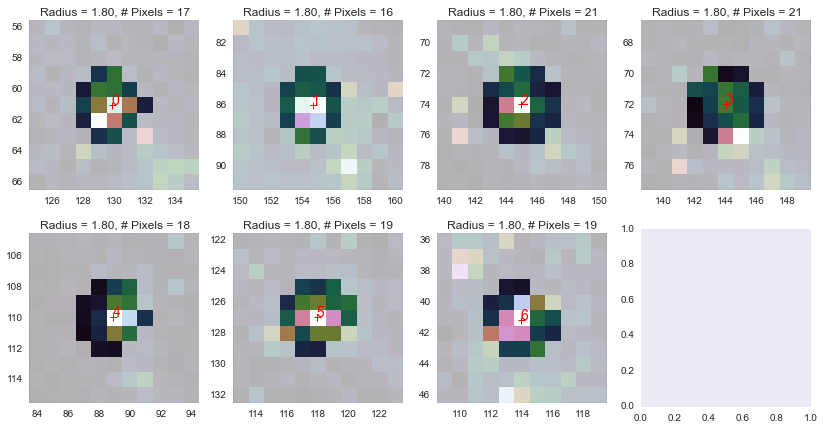

In [35]:
shape2d = (11, 11)
clip_radius = 1.8

nrows = 2
npoints = len(points_patched)
even_npoints = npoints if npoints % 2 == 0 else npoints + 1
ncols = even_npoints // 2

fig, ax = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3.5*nrows))
axr = ax.ravel()
for ip, point in enumerate(points_patched):
    rpoint = np.round(point)
    roi = tt.get_roi_square(rpoint, pad=(shape2d[0]-1)//2)
    axr[ip].imshow(hp_frame[roi], cmap='cubehelix', interpolation='none',
                   extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    axr[ip].plot(point[0], point[1], 'r+')
    axr[ip].annotate('%d' % ip, point, color='red', fontsize=14)
    
    mask = tt.get_roi_circle(point, clip_radius, frame.shape)
    a = np.ones(frame.shape)
    a[mask] = 0
    im = axr[ip].imshow(a[roi], interpolation='none', cmap='gray', vmin=0.5, alpha=0.7,
                        extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    im.cmap.set_under(alpha=0)
    axr[ip].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))

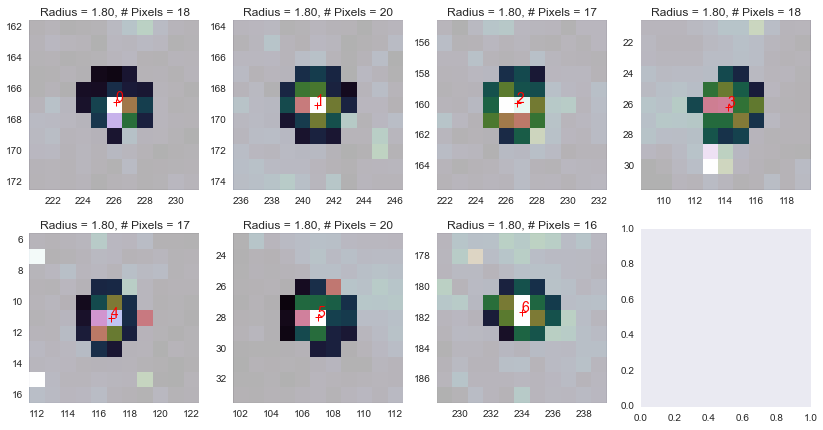

In [36]:
shape2d = (11, 11)
clip_radius = 1.8

nrows = 2
npoints = len(points_unpatched)
even_npoints = npoints if npoints % 2 == 0 else npoints + 1
ncols = even_npoints // 2

fig, ax = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3.5*nrows))
axr = ax.ravel()
for ip, point in enumerate(points_unpatched):
    rpoint = np.round(point)
    roi = tt.get_roi_square(rpoint, pad=(shape2d[0]-1)//2)
    axr[ip].imshow(hp_frame[roi], cmap='cubehelix', interpolation='none',
                   extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    axr[ip].plot(point[0], point[1], 'r+')
    axr[ip].annotate('%d' % ip, point, color='red', fontsize=14)
    
    mask = tt.get_roi_circle(point, clip_radius, frame.shape)
    a = np.ones(frame.shape)
    a[mask] = 0
    im = axr[ip].imshow(a[roi], interpolation='none', cmap='gray', vmin=0.5, alpha=0.7,
                        extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    im.cmap.set_under(alpha=0)
    axr[ip].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))

## Timetrace processing

In [37]:
%matplotlib inline

In [38]:
sns.set_style('darkgrid')

In [39]:
clip_radius = 1.8
vert_offset = 25

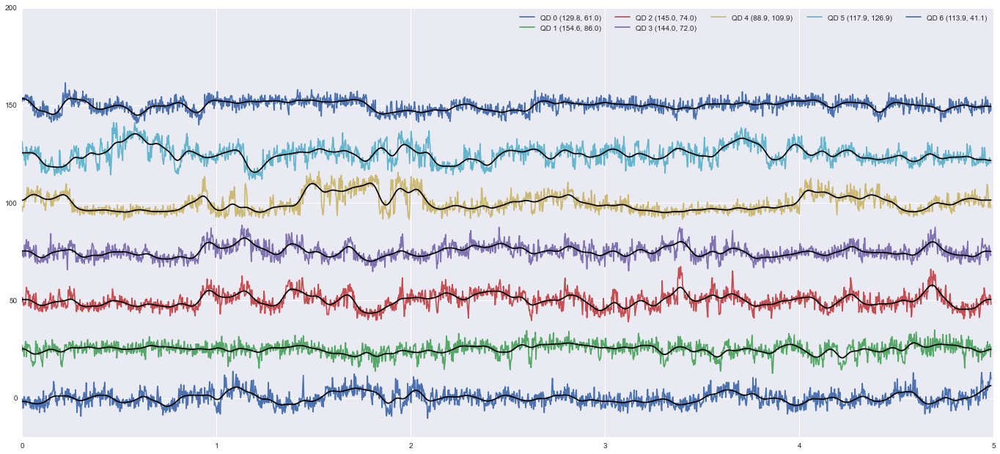

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(20, 1.5*len(points_patched)), sharex=True)
fig.subplots_adjust(left=0.04, right=0.96, hspace=0)
for i, point in enumerate(points_patched):
    timetrace = tt.get_timetrace(data.video, point, clip_radius=clip_radius, detrend_sigma=250)
    ftimetrace = ndi.filters.gaussian_filter1d(timetrace, 10)
    vpos = vert_offset*i
    
    l, = ax.plot(data.time, timetrace + vpos, 
                 label='QD %d (%.1f, %.1f)' % (i, point[0], point[1]))
    ax.plot(data.time, ftimetrace + vpos, color='k')
#ax.set_xlim(0, 2)
ax.set_ylim(-20)
plt.legend(ncol=5)

In [41]:
colors = sns.color_palette('deep', max(len(points_patched), len(points_unpatched)))

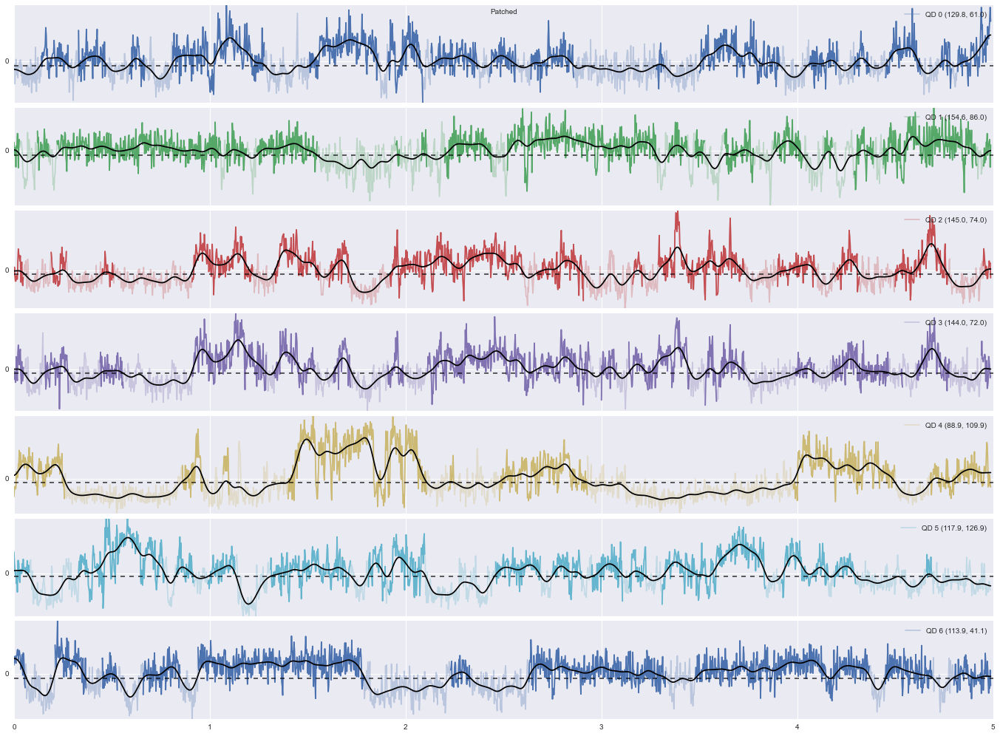

In [42]:
clip_radius = 1.8
detrend_sigma = 300
lowpass_sigma = 10
thresholds = [-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1]

points_sel = points_patched
fig, ax = plt.subplots(len(points_sel), 1, figsize=(20, 2*len(points_sel)), sharex=True)
fig.tight_layout()
fig.suptitle('Patched')
fig.subplots_adjust(left=0.04, right=0.96, hspace=0.05)
for i, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    ftimetrace = ndi.filters.gaussian_filter1d(timetrace, 10)
    on_periods = tt.get_on_periods_slices(timetrace, thresholds[i], lowpass_sigma=lowpass_sigma, align=4)
    
    ax[i].plot(data.time, timetrace, color=colors[i], alpha=0.3,
               label='QD %d (%.1f, %.1f)' % (i, point[0], point[1]))
    for on_period in on_periods:
        ax[i].plot(data.time[on_period], timetrace[on_period], color=colors[i], alpha=1)
    #ax[i].plot(data.time[time_on], trace_on, '.', color=colors[i], alpha=1)
    ax[i].plot(data.time, ftimetrace, color='k')
    ax[i].axhline(thresholds[i], color='k', ls='--', alpha=0.7)
    ax[i].locator_params(axis='y', tight=True, nbins=2)
    ax[i].legend()

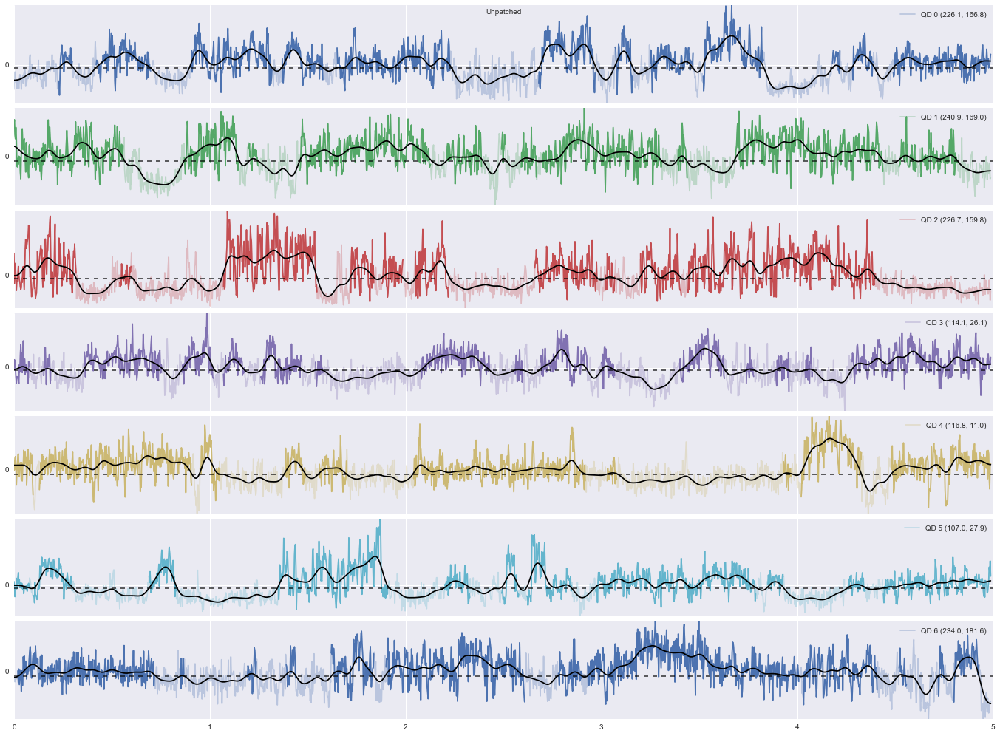

In [43]:
points_sel = points_unpatched

fig, ax = plt.subplots(len(points_sel), 1, figsize=(20, 2*len(points_sel)), sharex=True)
fig.tight_layout()
fig.suptitle('Unpatched')
fig.subplots_adjust(left=0.04, right=0.96, hspace=0.05)
for i, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    ftimetrace = ndi.filters.gaussian_filter1d(timetrace, 10)
    on_periods = tt.get_on_periods_slices(timetrace, thresholds[i], lowpass_sigma=lowpass_sigma, align=4)
    
    ax[i].plot(data.time, timetrace, color=colors[i], alpha=0.3,
               label='QD %d (%.1f, %.1f)' % (i, point[0], point[1]))
    for on_period in on_periods:
        ax[i].plot(data.time[on_period], timetrace[on_period], color=colors[i], alpha=1)
    #ax[i].plot(data.time[time_on], trace_on, '.', color=colors[i], alpha=1)
    ax[i].plot(data.time, ftimetrace, color='k')
    ax[i].axhline(thresholds[i], color='k', ls='--', alpha=0.7)
    ax[i].locator_params(axis='y', tight=True, nbins=2)
    ax[i].legend()

In [44]:
%matplotlib inline

In [45]:
sns.set_style('darkgrid')

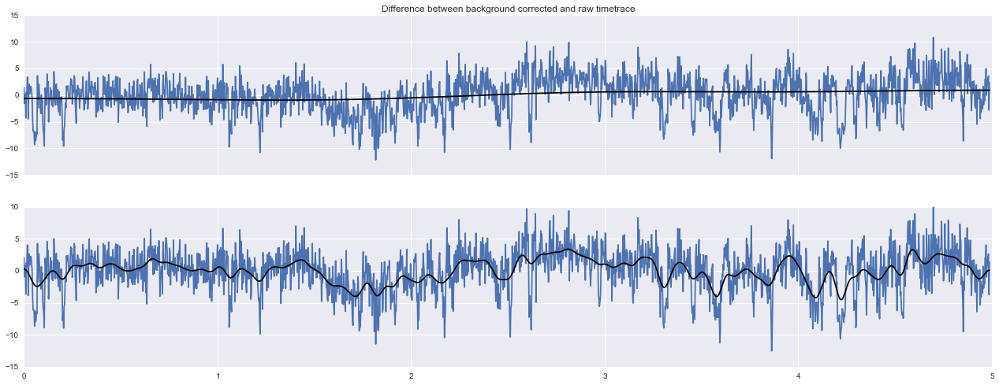

In [46]:
point = points_patched[1]

fig, ax = plt.subplots(2, 1, figsize=(22, 8), sharex=True)
timetrace1 = tt.get_timetrace(data.video, point, clip_radius=clip_radius, detrend_sigma=None)
trend = ndi.filters.gaussian_filter1d(timetrace1, detrend_sigma)
ftimetrace = ndi.filters.gaussian_filter1d(timetrace1 -  trend, lowpass_sigma)
ax[0].plot(data.time, timetrace1, label='QD (%.1f, %.1f)' % point);
ax[0].plot(data.time, trend, color='k');
ax[1].plot(data.time, timetrace1 - trend, label='QD (%.1f, %.1f)' % point);
ax[1].plot(data.time, ftimetrace, color='k');
ax[0].set_title('Difference between background corrected and raw timetrace');

## Fluorescence alternation analysis

## Signal definitions

### Def. 1. Sum of rising and falling edges

Given a timetrace $\{t_k\}$, where $t_k$ is the ROI-average in frame $k$, the signal is compute as follows:

1. compute the 2-frame average timetrace $\{t'_i\}$, where $t'_i = (t_{2i} + t_{2i + 1})/2$
2. compute $\{d_i\}$ as $d_i = (t'_i - t'_{i+1}) + (t'_{i+2} - t'_{i+1})$
3. for the out-of-phase case, points (1) and (2) are repeated dropping the first element from $\{t_k\}$

> This signal is computed by the function `tt.double_edge_diff_avg()`

### Def. 2. Alternated differences

Given a timetrace $\{t_k\}$, where $t_k$ is the ROI-average in frame $k$, the signal is compute as follows:

1. compute the 2-frame average timetrace $\{t'_i\}$, where $t'_i = (t_{2i} + t_{2i + 1})/2$
2. compute $\{d_1, d_2, d_3, d_4, ...\} = \{(t'_0 - t'_1),\; -(t'_2 - t'_1),\; (t'_3 - t'_2),\; -(t'_4 - t'_3)....\}$, which is the finite-difference with aleternated sign. 
3. for the out-of-phase case, points (1) and (2) are repeated dropping the first element from $\{t_k\}$

> This signal is computed by functions `tt.edge_diff_avg_alt()` and `tt.edge_diff_avg_alt_ndiff()`

In [47]:
f0 = 100
sim_signal = 1 + np.cos(2*np.pi*f0*data.time - np.pi/4)

In [48]:
points_sel = points_patched
clip_radius = 1.8
detrend_sigma = 300

mdouble_diff, mdouble_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
sdouble_diff, sdouble_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace += 0.5*sim_signal
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    double_diff = tt.edge_diff_sum(timetrace_on, offset=0)
    double_diffo = tt.edge_diff_sum(timetrace_on, offset=1)
    
    mdouble_diff[ip], mdouble_diffo[ip] = double_diff.mean(), double_diffo.mean()
    sdouble_diff[ip], sdouble_diffo[ip] = double_diff.std(), double_diffo.std()

fig, ax = plt.subplots(1, 3, figsize=(18, 4))
ax[0].plot(mdouble_diff, '-o', mew=0, ms=6, label='2-edges sum')
ax[0].plot(mdouble_diffo, '-o', mew=0, ms=6, label='2-edges sum out-of-phase')
ax[0].set_title('Mean of (sum of falling and rising edges)')
ax[1].plot(sdouble_diff, '-o', mew=0, ms=6, label='2-edges sum')
ax[1].plot(sdouble_diffo, '-o', mew=0, ms=6, label='2-edges sum out-of-phase')
ax[1].set_title('Std.Dev. of (sum of falling and rising edges)')
ax[2].plot(mdouble_diff/sdouble_diff, '-o', mew=0, ms=6, label='2-edges sum')
ax[2].plot(mdouble_diffo/sdouble_diffo, '-o', mew=0, ms=6, label='2-edges sum out-of-phase')
ax[2].set_title('SNR of (sum of falling and rising edges)')
ax[1].set_xlabel('Quantum Dot')
ax[2].legend(ncol=2);
fig.suptitle('Patched');
plt.close(fig)
fig_patched = fig

In [49]:
points_sel = points_unpatched

mdouble_diff, mdouble_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
sdouble_diff, sdouble_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    double_diff = tt.edge_diff_sum(timetrace_on, offset=0)
    double_diffo = tt.edge_diff_sum(timetrace_on, offset=1)
    
    mdouble_diff[ip], mdouble_diffo[ip] = double_diff.mean(), double_diffo.mean()
    sdouble_diff[ip], sdouble_diffo[ip] = double_diff.std(), double_diffo.std()

fig, ax = plt.subplots(1, 3, figsize=(18, 4))
ax[0].plot(mdouble_diff, '-o', mew=0, ms=6, label='2-edges sum')
ax[0].plot(mdouble_diffo, '-o', mew=0, ms=6, label='2-edges sum out-of-phase')
ax[0].set_title('Mean of (sum of falling and rising edges)')
ax[1].plot(sdouble_diff, '-o', mew=0, ms=6, label='2-edges sum')
ax[1].plot(sdouble_diffo, '-o', mew=0, ms=6, label='2-edges sum out-of-phase')
ax[1].set_title('Std.Dev. of (sum of falling and rising edges)')
ax[2].plot(mdouble_diff/sdouble_diff, '-o', mew=0, ms=6, label='2-edges sum')
ax[2].plot(mdouble_diffo/sdouble_diffo, '-o', mew=0, ms=6, label='2-edges sum out-of-phase')
ax[2].set_title('SNR of (sum of falling and rising edges)')
ax[1].set_xlabel('Quantum Dot')
ax[2].legend(ncol=2);
fig.suptitle('Unpatched');
plt.close(fig)
fig_unpatched = fig

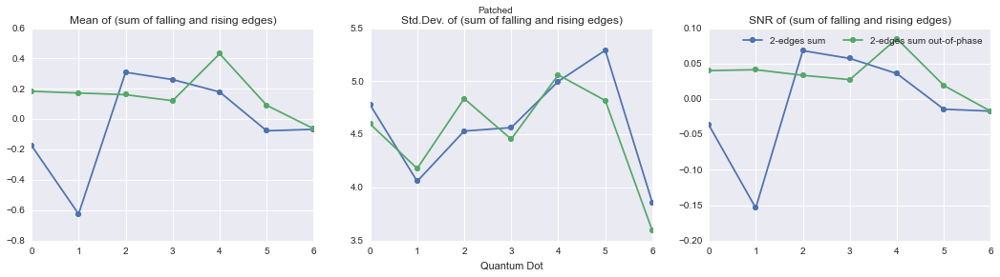

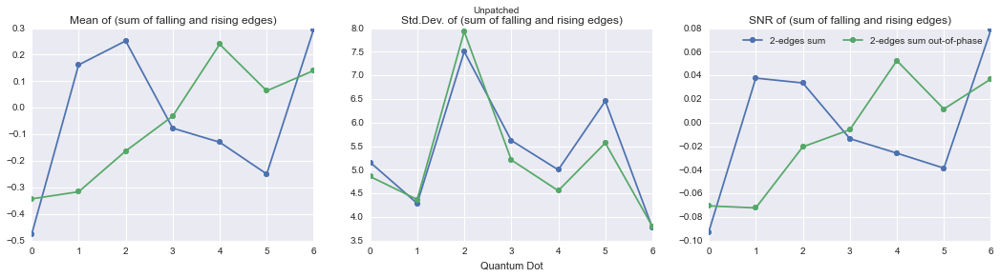

In [50]:
display(fig_patched)
display(fig_unpatched)

### Figure caption
The previous figure uses **Def.1.** and shows $\textrm{mean}(\{d_i\})$ (*column 1*), 
$\textrm{std_dev}(\{d_i\})$ (*column 2*) and 
$\textrm{mean}(\{d_i\})/\textrm{std_dev}(\{d_i\})$ (*column 3*).

### Figure comments

#### Patched vs unpatched

- **Patched QD:** (*first row*) QD 0 and 4 have the highest signal, both as **absolute amplitude** (*column 1*) and as **SNR** (*column 3*)
- **Unpatched QD:** (*second row*) The absolute signal reaches 0.2-0.3, but never 0.7 as the patched QD 0. However the (apparent) **SNR** reaches 0.1-0.12. This seems to invalidate patched QD 4 as a statistically relevant.

#### In-phase vs out-of-phase

- **Patched QD:** (*first row*) QD0 and 4 show a marked difference between in-phase (**blue**) and out-of-phase (**green**)
- **Unpatched QD:** (*second row*) The difference between in-phase (**blue**) and out-of-phase (**green**) is more random. 
  However, upatched QD 1 and 9 (highest apparent SNR) show also a marked difference between in-phase and out-of-phase.

## *n*-periods averages

The *n*-cycles average is computed as a *n*-elements running (or block) average on the array $\{d_i\}$.

> **NOTE**: The array $\{d_i\}$ can be computed either according to **Def. 1** or **Def. 2**. 
> Swapping definition (with constant  *n*) results in averaging a different number of periods.

### Implementation

#### Def. 1

Call `tt.running_average()` passing the array $\{d_i\}$ previously computed via `tt.double_edge_diff_avg()`. 
Alternatively use `tt.block_average()` for block average.

#### Def. 2

The function `tt.edge_diff_avg_ndiff()` computes the *n*-samples average of $\{d_i\}$ starting from the raw timetrace.
If can compute both runnning (default) or block average.

## Def. 1. Mean, Std, SNR

In [51]:
%matplotlib inline

In [52]:
sns.set_style('darkgrid')

In [53]:
points_sel = points_patched
ncycles = 9
running_avg = True
clip_radius = 1.8
detrend_sigma = 300

n_mdouble_diff, n_mdouble_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_sdouble_diff, n_sdouble_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace += 0.5*sim_signal
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    double_diff = tt.edge_diff_sum(timetrace_on)
    double_diffo = tt.edge_diff_sum(timetrace_on, offset=1)
    n_double_diff = tt.avg_nsamples(double_diff, num_samples=ncycles, running_avg=running_avg)
    n_double_diffo = tt.avg_nsamples(double_diffo, num_samples=ncycles, running_avg=running_avg)
    
    n_mdouble_diff[ip], n_mdouble_diffo[ip] = n_double_diff.mean(), n_double_diffo.mean()
    n_sdouble_diff[ip], n_sdouble_diffo[ip] = n_double_diff.std(),  n_double_diffo.std()

name = '%d-cycles avg of 2-edges sum' % ncycles 
fig, ax = plt.subplots(1, 3, figsize=(18, 4))
ax[0].plot(n_mdouble_diff, '-o', mew=0, ms=6, label='in-phase')
ax[0].plot(n_mdouble_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[0].set_title('Mean of (%s)' % name)
ax[1].plot(n_sdouble_diff, '-o', mew=0, ms=6, label='in-phase')
ax[1].plot(n_sdouble_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[1].set_title('Std.Dev. of (%s)' % name)
ax[2].plot(n_mdouble_diff/n_sdouble_diff, '-o', mew=0, ms=6, label='in-phase')
ax[2].plot(n_mdouble_diffo/n_sdouble_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[2].set_title('SNR of (%s)' % name)
ax[1].set_xlabel('Quantum Dot')
ax[2].legend(ncol=2);
fig.suptitle('Patched, %d-cycles average' % ncycles);
plt.close(fig)
fig_patched = fig

In [54]:
points_sel = points_unpatched

n_mdouble_diff, n_mdouble_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_sdouble_diff, n_sdouble_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    double_diff = tt.edge_diff_sum(timetrace_on)
    double_diffo = tt.edge_diff_sum(timetrace_on, offset=1)
    n_double_diff = tt.avg_nsamples(double_diff, num_samples=ncycles, running_avg=running_avg)
    n_double_diffo = tt.avg_nsamples(double_diffo, num_samples=ncycles, running_avg=running_avg)
    
    n_mdouble_diff[ip], n_mdouble_diffo[ip] = n_double_diff.mean(), n_double_diffo.mean()
    n_sdouble_diff[ip], n_sdouble_diffo[ip] = n_double_diff.std(),  n_double_diffo.std()

name = '%d-cycles avg of 2-edges sum' % ncycles 
fig, ax = plt.subplots(1, 3, figsize=(18, 4))
ax[0].plot(n_mdouble_diff, '-o', mew=0, ms=6, label='in-phase')
ax[0].plot(n_mdouble_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[0].set_title('Mean of (%s)' % name)
ax[1].plot(n_sdouble_diff, '-o', mew=0, ms=6, label='in-phase')
ax[1].plot(n_sdouble_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[1].set_title('Std.Dev. of (%s)' % name)
ax[2].plot(n_mdouble_diff/n_sdouble_diff, '-o', mew=0, ms=6, label='in-phase')
ax[2].plot(n_mdouble_diffo/n_sdouble_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[2].set_title('SNR of (%s)' % name)
ax[1].set_xlabel('Quantum Dot')
ax[2].legend(ncol=2);
fig.suptitle('Unpatched, %d-cycles average' % ncycles);
plt.close(fig)
fig_unpatched = fig

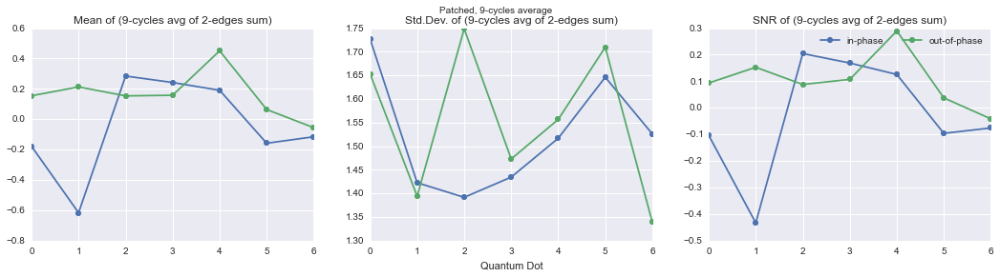

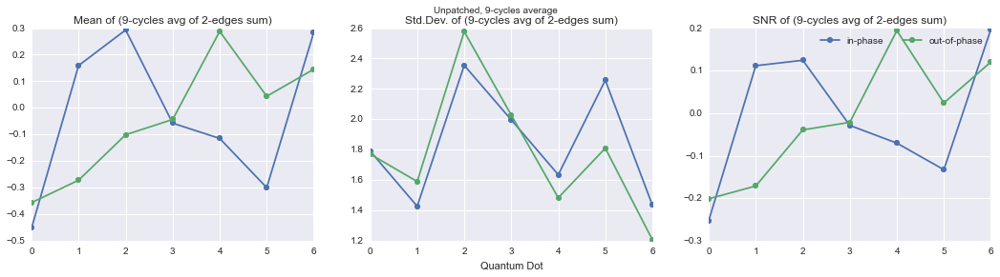

In [55]:
display(fig_patched)
display(fig_unpatched)

## Def. 2. Mean, Std, SNR

In [56]:
points_sel = points_patched
ncycles = 18
running_avg = True
clip_radius = 1.8
detrend_sigma = 300

n_mean_diff, n_mean_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_std_diff, n_std_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on)
    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)
    n_all_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)
    n_all_diffo = tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg)

    n_mean_diff[ip], n_mean_diffo[ip] = n_all_diff.mean(), n_all_diffo.mean()
    n_std_diff[ip], n_std_diffo[ip] = n_all_diff.std(), n_all_diffo.std()

name = '%d-cycles avg of alternated diff' % ncycles 
fig, ax = plt.subplots(1, 3, figsize=(18, 4))
ax[0].plot(n_mean_diff, '-o', mew=0, ms=6, label='in-phase')
ax[0].plot(n_mean_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[0].set_title('Mean of (%s)' % name)
ax[1].plot(n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[1].plot(n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[1].set_title('Std.Dev. of (%s)' % name)
ax[2].plot(n_mean_diff/n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[2].plot(n_mean_diffo/n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[2].set_title('SNR of (%s)' % name)
ax[1].set_xlabel('Quantum Dot')
ax[2].legend(ncol=2);
fig.suptitle('Patched');
plt.close(fig)
fig_patched = fig;

In [57]:
points_sel = points_unpatched

n_mean_diff, n_mean_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_std_diff, n_std_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on)
    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)
    n_all_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)
    n_all_diffo = tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg)

    n_mean_diff[ip], n_mean_diffo[ip] = n_all_diff.mean(), n_all_diffo.mean()
    n_std_diff[ip], n_std_diffo[ip] = n_all_diff.std(), n_all_diffo.std()


fig, ax = plt.subplots(1, 3, figsize=(18, 4))
ax[0].plot(n_mean_diff, '-o', mew=0, ms=6, label='in-phase')
ax[0].plot(n_mean_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[0].set_title('Mean of (%s)' % name)
ax[1].plot(n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[1].plot(n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[1].set_title('Std.Dev. of (%s)' % name)
ax[2].plot(n_mean_diff/n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[2].plot(n_mean_diffo/n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[2].set_title('SNR of (%s)' % name)
ax[1].set_xlabel('Quantum Dot')
ax[2].legend(ncol=2);
fig.suptitle('Unpatched');
plt.close(fig)
fig_unpatched = fig;

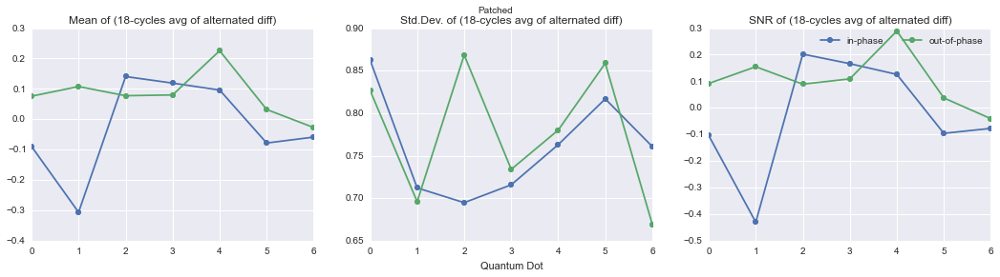

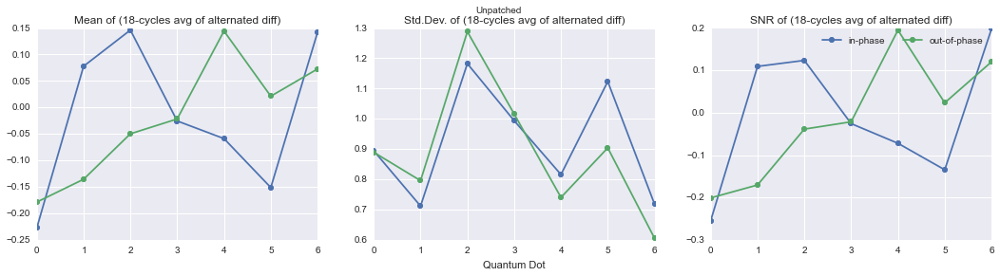

In [58]:
display(fig_patched)
display(fig_unpatched)

## Def. 2. Signal *vs* time

In [59]:
def t_run(sample_diff, num_samples, running_avg):
    if running_avg:
        return np.arange(0, sample_diff.size)*2 + 0.5 + num_samples
    else:
        return np.arange(0, sample_diff.size)*2*num_samples + num_samples

In [60]:
points_sel = points_patched
ncycles = 16
running_avg = True
clip_radius = 1.8
detrend_sigma = 300

n_alt_diff, n_alt_diffo = [], []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace += 0.5*sim_signal
    timetrace_on = timetrace
    #time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    n_alt_diff.append(
        tt.avg_nsamples(tt.edge_diff_all(timetrace, offset=0), 
                        num_samples=ncycles, running_avg=running_avg))
    n_alt_diffo.append(
        tt.avg_nsamples(tt.edge_diff_all(timetrace, offset=1), 
                        num_samples=ncycles, running_avg=running_avg))
        
alpha = 0.8
name = '%d-cycles avg of 2-edges sum' % ncycles
fig, ax = plt.subplots(len(points_sel), 1, 
                       figsize=(18, 4*len(points_sel)),
                       sharex=False)
fig.tight_layout()
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    signal_clue = n_alt_diff[ip]**2
    signal_clueo = n_alt_diffo[ip]**2
    ax[ip].plot(t_run(signal_clue, ncycles, running_avg), 
                signal_clue, label='QD %d: signal^2 (%d cycles) in-phase' % (ip, ncycles), alpha=alpha)
    ax[ip].plot(t_run(signal_clueo, ncycles, running_avg), 
                signal_clueo, label='QD %d: signal^2 (%d cycles) out-of-phase' % (ip, ncycles), alpha=alpha)

    ax2 = ax[ip].twinx()
    ax2.grid(False)
    ax2.plot(timetrace, 'k', alpha=0.3)
    ax2.set_ylim(-40)

    ax[0].set_title('Patched: %d-cycles average' % ncycles)
    ax[ip].legend(loc='upper left')
    #ax[ip].set_ylim(-0, 20)
plt.close(fig)
fig_patched = fig;

In [61]:
points_sel = points_unpatched

n_alt_diff, n_alt_diffo = [], []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    timetrace_on = timetrace
    #time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    n_alt_diff.append(
        tt.avg_nsamples(tt.edge_diff_all(timetrace, offset=0), 
                        num_samples=ncycles, running_avg=running_avg))
    n_alt_diffo.append(
        tt.avg_nsamples(tt.edge_diff_all(timetrace, offset=1), 
                        num_samples=ncycles, running_avg=running_avg))
        

fig, ax = plt.subplots(len(points_sel), 1, 
                       figsize=(18, 4*len(points_sel)),
                       sharex=False)
fig.tight_layout()
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    signal_clue = n_alt_diff[ip]**2 
    signal_clueo = n_alt_diffo[ip]**2
    ax[ip].plot(t_run(signal_clue, ncycles, running_avg), 
                signal_clue, label='QD %d: signal^2 (%d cycles) in-phase' % (ip, ncycles), alpha=alpha)
    ax[ip].plot(t_run(signal_clueo, ncycles, running_avg), 
                signal_clueo, label='QD %d: signal^2 (%d cycles) out-of-phase' % (ip, ncycles), alpha=alpha)
    
    ax2 = ax[ip].twinx()
    ax2.grid(False)
    ax2.plot(timetrace, 'k', alpha=0.3)
    ax2.set_ylim(-40)

    ax[0].set_title('Unpatched: %d-cycles average' % ncycles)
    ax[ip].legend(loc='upper left')
    #ax[ip].set_ylim(-0, 20)
plt.close(fig)
fig_unpatched = fig;

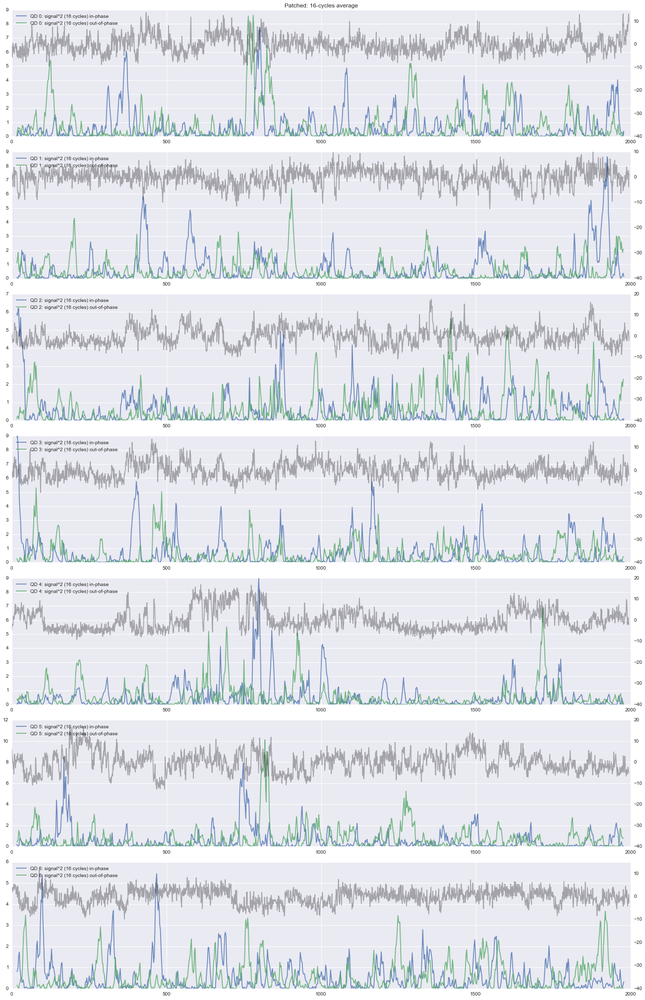

In [62]:
fig_patched

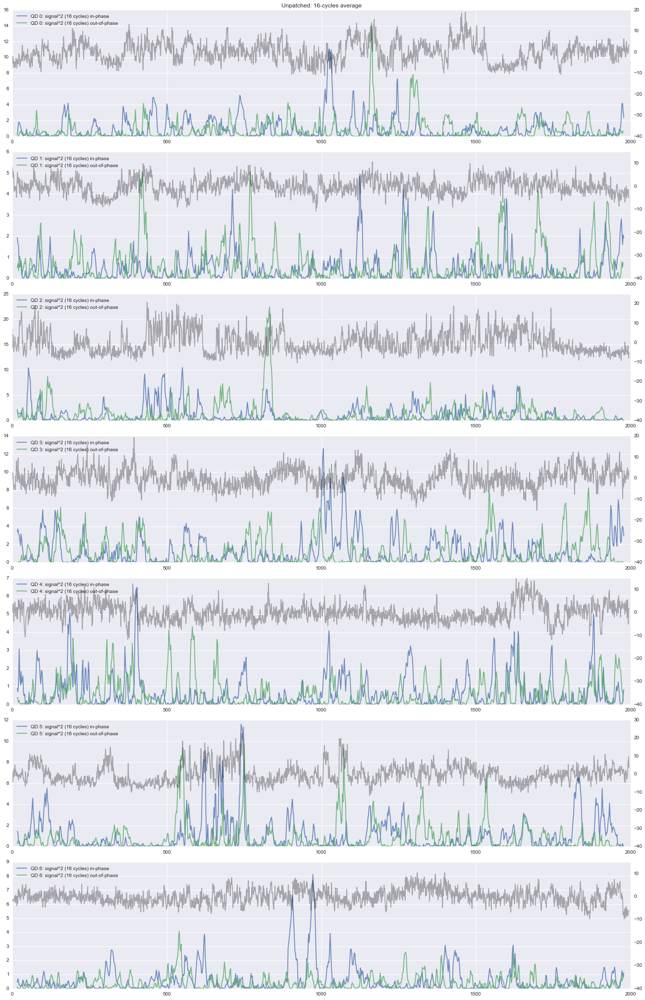

In [63]:
fig_unpatched

## Def.1. Histograms

In [64]:
points_sel = points_patched
multi_ncycles = [1, 4, 9, 14]
running_avg = True
clip_radius = 1.8
detrend_sigma = 300

mdouble_diff, mdouble_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
sdouble_diff, sdouble_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_double_diff, n_double_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}
for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace += 0.5*sim_signal
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        double_diff = tt.edge_diff_sum(timetrace_on)
        double_diffo = tt.edge_diff_sum(timetrace_on, offset=1)
        n_double_diff[ncycles].append(tt.avg_nsamples(double_diff, num_samples=ncycles, running_avg=running_avg))
        n_double_diffo[ncycles].append(tt.avg_nsamples(double_diffo, num_samples=ncycles, running_avg=running_avg))

alpha = 0.5
nbins = 25
name = '%d-cycles avg of 2-edges sum' % ncycles
fig, ax = plt.subplots(len(points_sel), len(multi_ncycles), 
                       figsize=(4*len(multi_ncycles), 3*len(points_sel)),
                       sharex=False)
fig.tight_layout()
for ip, point in enumerate(points_sel):
    for cidx, ncycles in enumerate(multi_ncycles):
        sample, sampleo = n_double_diff[ncycles][ip], n_double_diffo[ncycles][ip]
        
        bin_abs_max = np.max([np.abs(sample).max(), np.abs(sampleo).max()])
        bins = np.linspace(-bin_abs_max*1.1, bin_abs_max*1.1, nbins+1)
        centers = bins[:-1] + 0.5*(bins[1] - bins[0])

        ax[ip, cidx].hist(n_double_diff[ncycles][ip], bins=bins, label='QD %d in-phase' % ip, alpha=alpha)
        ax[ip, cidx].hist(n_double_diffo[ncycles][ip], bins=bins, label='QD %d out-of-phase' % ip, alpha=alpha)
        ax[ip, cidx].axvline(n_double_diff[ncycles][ip].mean(), color=colors[0])
        ax[ip, cidx].axvline(n_double_diffo[ncycles][ip].mean(), color=colors[1])
        
        ax[0, cidx].set_title('Patched: %d-cycles average' % ncycles)
    ax[ip, 0].legend(loc='upper left')
plt.close(fig)
fig_patched = fig;

In [65]:
points_sel = points_unpatched

mdouble_diff, mdouble_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
sdouble_diff, sdouble_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_double_diff, n_double_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}
for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        double_diff = tt.edge_diff_sum(timetrace_on)
        double_diffo = tt.edge_diff_sum(timetrace_on, offset=1)
        n_double_diff[ncycles].append(tt.avg_nsamples(double_diff, num_samples=ncycles, running_avg=running_avg))
        n_double_diffo[ncycles].append(tt.avg_nsamples(double_diffo, num_samples=ncycles, running_avg=running_avg))


fig, ax = plt.subplots(len(points_sel), len(multi_ncycles), 
                       figsize=(4*len(multi_ncycles), 3*len(points_sel)),
                       sharex=False)
fig.tight_layout()
for ip, point in enumerate(points_sel):
    for cidx, ncycles in enumerate(multi_ncycles):
        sample, sampleo = n_double_diff[ncycles][ip], n_double_diffo[ncycles][ip]
        
        bin_abs_max = np.max([np.abs(sample).max(), np.abs(sampleo).max()])
        bins = np.linspace(-bin_abs_max*1.1, bin_abs_max*1.1, nbins+1)
        centers = bins[:-1] + 0.5*(bins[1] - bins[0])

        ax[ip, cidx].hist(n_double_diff[ncycles][ip], bins=bins, label='QD %d in-phase' % ip, alpha=alpha)
        ax[ip, cidx].hist(n_double_diffo[ncycles][ip], bins=bins, label='QD %d out-of-phase' % ip, alpha=alpha)
        ax[ip, cidx].axvline(n_double_diff[ncycles][ip].mean(), color=colors[0])
        ax[ip, cidx].axvline(n_double_diffo[ncycles][ip].mean(), color=colors[1])
        
        ax[0, cidx].set_title('Unpatched: %d-cycles average' % ncycles)
    ax[ip, 0].legend(loc='upper left')
plt.close(fig)
fig_unpatched = fig;

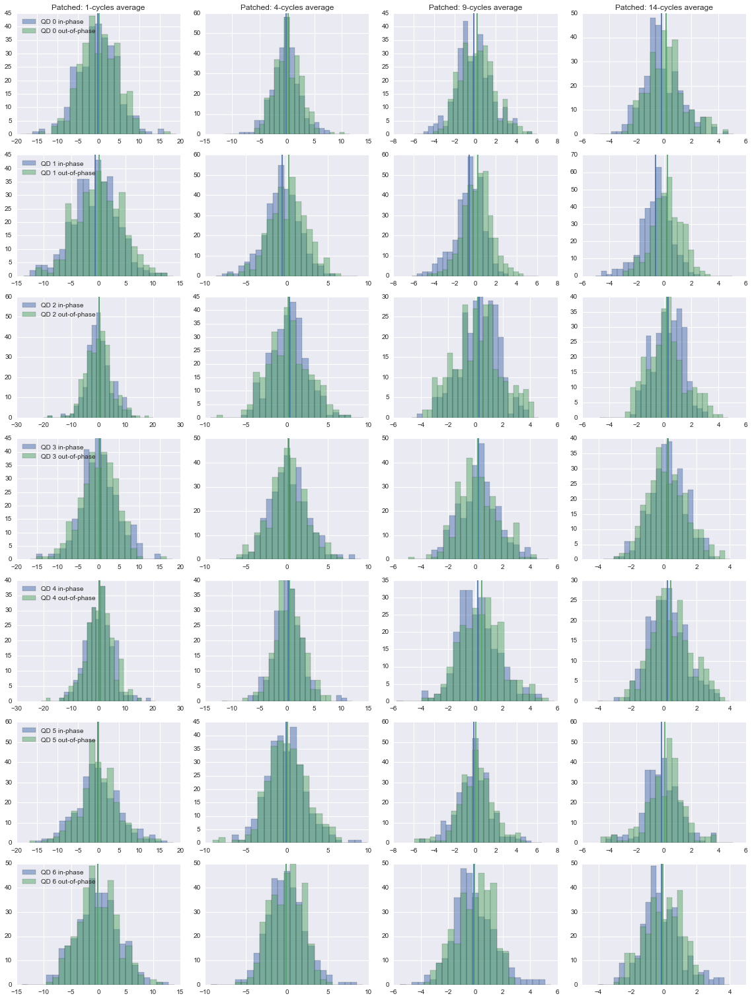

In [66]:
display(fig_patched)

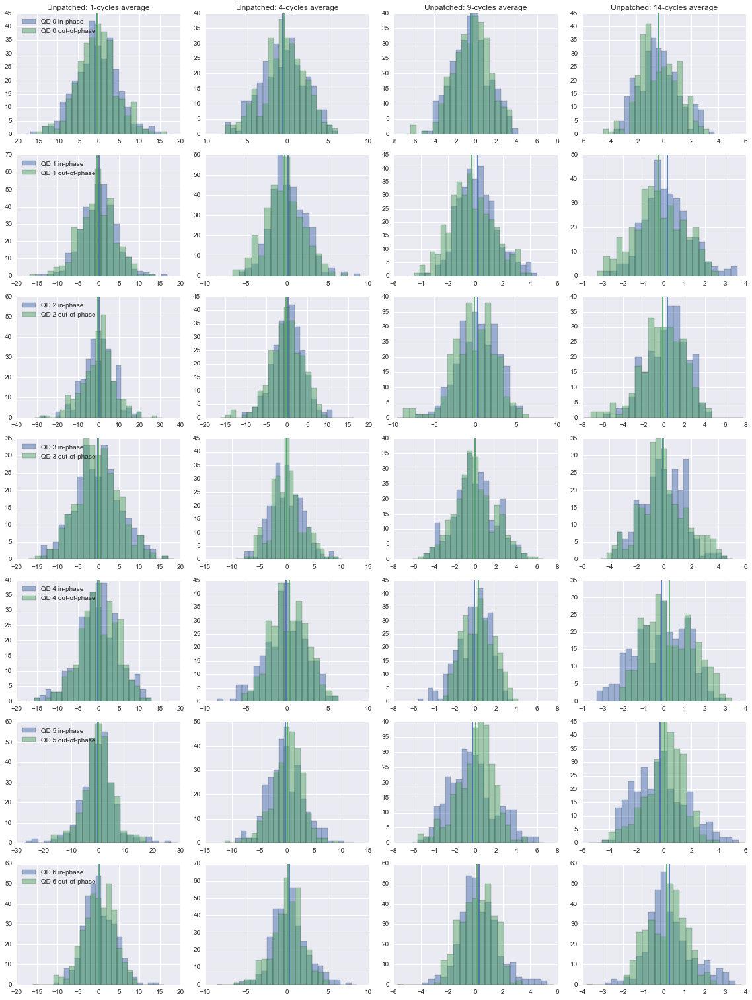

In [67]:
display(fig_unpatched)

## Def. 2. Histograms

In [68]:
points_sel = points_patched
multi_ncycles = [2, 8, 18, 28]
running_avg = True
clip_radius = 1.8
detrend_sigma = 300

n_alt_diff, n_alt_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}
for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        alt_diff = tt.edge_diff_all(timetrace_on, offset=0) 
        alt_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        n_alt_diff[ncycles].append(
            tt.avg_nsamples(alt_diff, num_samples=ncycles, running_avg=running_avg))
        n_alt_diffo[ncycles].append(
            tt.avg_nsamples(alt_diffo, num_samples=ncycles, running_avg=running_avg))

alpha = 0.5
nbins = 25
name = '%d-cycles avg of alt. diff.' % ncycles
fig, ax = plt.subplots(len(points_sel), len(multi_ncycles), 
                       figsize=(4*len(multi_ncycles), 3*len(points_sel)))
fig.tight_layout()
for ip, point in enumerate(points_sel):
    for cidx, ncycles in enumerate(multi_ncycles):
        sample, sampleo = n_alt_diff[ncycles][ip], n_alt_diffo[ncycles][ip]
        
        bin_abs_max = np.max([np.abs(sample).max(), np.abs(sampleo).max()])
        bins = np.linspace(-bin_abs_max*1.1, bin_abs_max*1.1, nbins+1)
        centers = bins[:-1] + 0.5*(bins[1] - bins[0])

        ax[ip, cidx].hist(n_alt_diff[ncycles][ip], bins=bins, label='QD %d in-phase' % ip, alpha=alpha)
        ax[ip, cidx].hist(n_alt_diffo[ncycles][ip], bins=bins, label='QD %d out-of-phase' % ip, alpha=alpha)
        ax[ip, cidx].axvline(n_alt_diff[ncycles][ip].mean(), color=colors[0])
        ax[ip, cidx].axvline(n_alt_diffo[ncycles][ip].mean(), color=colors[1])
        
        ax[0, cidx].set_title('Patched: %d-cycles average' % ncycles)
    ax[ip, 0].legend(loc='upper left')
plt.close(fig)
fig_patched = fig;

In [69]:
points_sel = points_unpatched

n_alt_diff, n_alt_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}
for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        alt_diff = tt.edge_diff_all(timetrace_on, offset=0) 
        alt_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        n_alt_diff[ncycles].append(
            tt.avg_nsamples(alt_diff, num_samples=ncycles, running_avg=running_avg))
        n_alt_diffo[ncycles].append(
            tt.avg_nsamples(alt_diffo, num_samples=ncycles, running_avg=running_avg))
        

fig, ax = plt.subplots(len(points_sel), len(multi_ncycles), 
                       figsize=(4*len(multi_ncycles), 3*len(points_sel)))
fig.tight_layout()
for ip, point in enumerate(points_sel):
    for cidx, ncycles in enumerate(multi_ncycles):
        sample, sampleo = n_alt_diff[ncycles][ip], n_alt_diffo[ncycles][ip]
        
        bin_abs_max = np.max([np.abs(sample).max(), np.abs(sampleo).max()])
        bins = np.linspace(-bin_abs_max*1.1, bin_abs_max*1.1, nbins+1)
        centers = bins[:-1] + 0.5*(bins[1] - bins[0])

        ax[ip, cidx].hist(n_alt_diff[ncycles][ip], bins=bins, label='QD %d in-phase' % ip, alpha=alpha)
        ax[ip, cidx].hist(n_alt_diffo[ncycles][ip], bins=bins, label='QD %d out-of-phase' % ip, alpha=alpha)
        ax[ip, cidx].axvline(n_alt_diff[ncycles][ip].mean(), color=colors[0])
        ax[ip, cidx].axvline(n_alt_diffo[ncycles][ip].mean(), color=colors[1])
        
        ax[0, cidx].set_title('Unpatched: %d-cycles average' % ncycles)
    ax[ip, 0].legend(loc='upper left')
plt.close(fig)
fig_unpatched = fig;

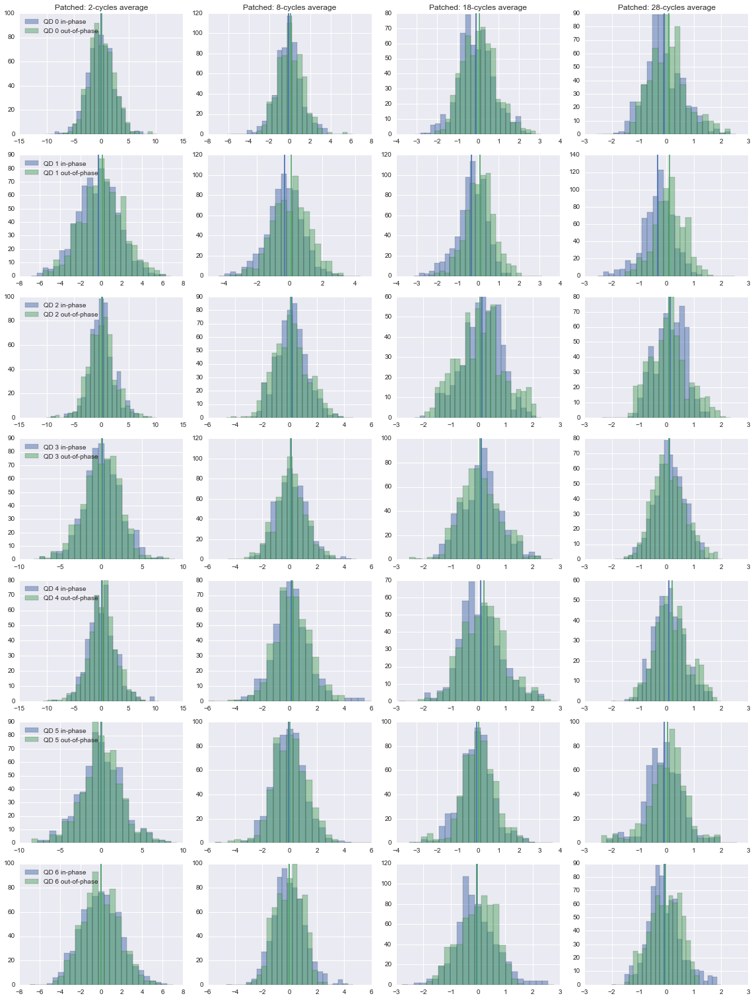

In [70]:
fig_patched

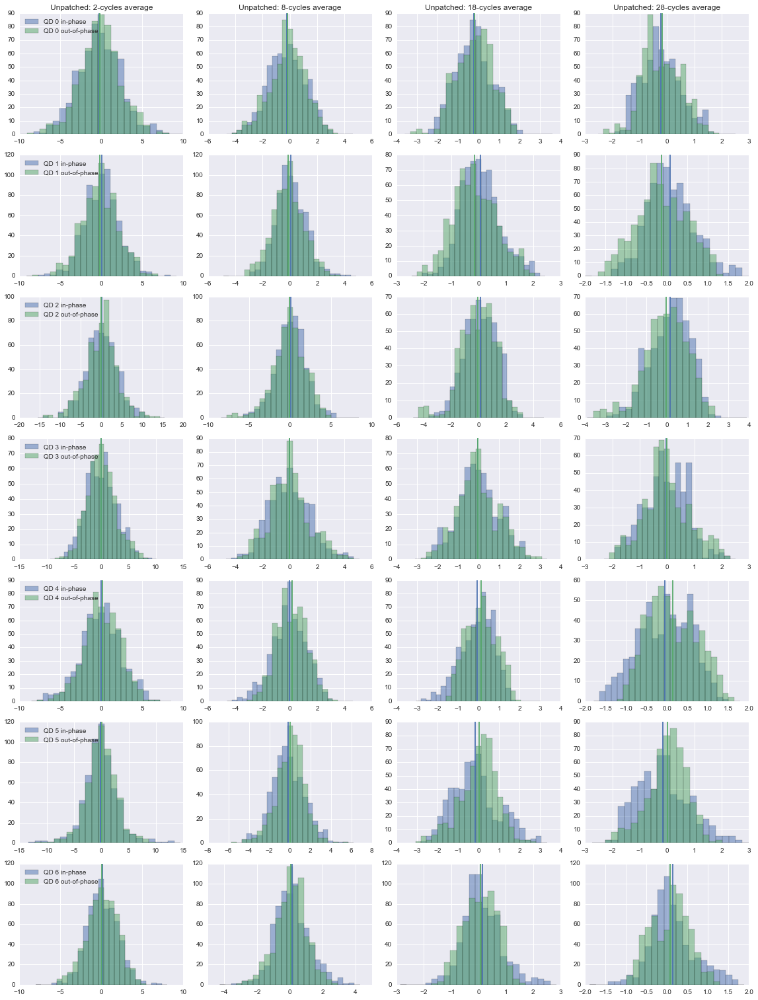

In [71]:
fig_unpatched

## Def. 1. Signal vs *n*-cycles

In [72]:
points_sel = points_patched
multi_ncycles = [1, 4, 9, 14, 32]
running_avg = True
clip_radius = 1.8
detrend_sigma = 300

n_double_diff, n_double_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}
for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace += 0.5*sim_signal
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)
        
        double_diff = tt.edge_diff_sum(timetrace_on)
        double_diffo = tt.edge_diff_sum(timetrace_on, offset=1)
        n_double_diff[ncycles].append(
            tt.avg_nsamples(double_diff, num_samples=ncycles, running_avg=running_avg))
        n_double_diffo[ncycles].append(
            tt.avg_nsamples(double_diffo, num_samples=ncycles, running_avg=running_avg))
        
alpha = 0.8
name = 'SNR vs cycles avg.'
fig, ax = plt.subplots(len(points_sel), 1, 
                       figsize=(12, 3*len(points_sel)), sharex=True)
fig.tight_layout()
for ip, point in enumerate(points_sel):
    signal_cycle = [n_double_diff[nc][ip].mean()/n_double_diff[nc][ip].std() 
                    for nc in multi_ncycles]
    signal_cycleo = [n_double_diffo[nc][ip].mean()/n_double_diffo[nc][ip].std() 
                     for nc in multi_ncycles]
    ax[ip].plot(signal_cycle, '-o', ms=6, mew=0, label='QD %d in-phase' % ip, alpha=alpha)
    ax[ip].plot(signal_cycleo, '-o', ms=6, mew=0, label='QD %d out-of-phase' % ip, alpha=alpha)
    ax[ip].legend(loc='upper left')

ax[0].set_title('Patched: %s' % name)
ax[ip].set_xticklabels(multi_ncycles)
plt.close(fig)
fig_patched = fig;

In [73]:
points_sel = points_unpatched

n_double_diff, n_double_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}
for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)
        
        double_diff = tt.edge_diff_sum(timetrace_on)
        double_diffo = tt.edge_diff_sum(timetrace_on, offset=1)
        n_double_diff[ncycles].append(
            tt.avg_nsamples(double_diff, num_samples=ncycles, running_avg=running_avg))
        n_double_diffo[ncycles].append(
            tt.avg_nsamples(double_diffo, num_samples=ncycles, running_avg=running_avg))
        
alpha = 0.8
name = 'SNR vs cycles avg.'
fig, ax = plt.subplots(len(points_sel), 1, 
                       figsize=(12, 3*len(points_sel)), sharex=True)
fig.tight_layout()
for ip, point in enumerate(points_sel):
    signal_cycle = [n_double_diff[nc][ip].mean()/n_double_diff[nc][ip].std() 
                    for nc in multi_ncycles]
    signal_cycleo = [n_double_diffo[nc][ip].mean()/n_double_diffo[nc][ip].std() 
                     for nc in multi_ncycles]
    ax[ip].plot(signal_cycle, '-o', ms=6, mew=0, label='QD %d in-phase' % ip, alpha=alpha)
    ax[ip].plot(signal_cycleo, '-o', ms=6, mew=0, label='QD %d out-of-phase' % ip, alpha=alpha)
    ax[ip].legend(loc='upper left')

ax[0].set_title('Unpatched: %s' % name)
ax[ip].set_xticklabels(multi_ncycles)
plt.close(fig)
fig_unpatched = fig;

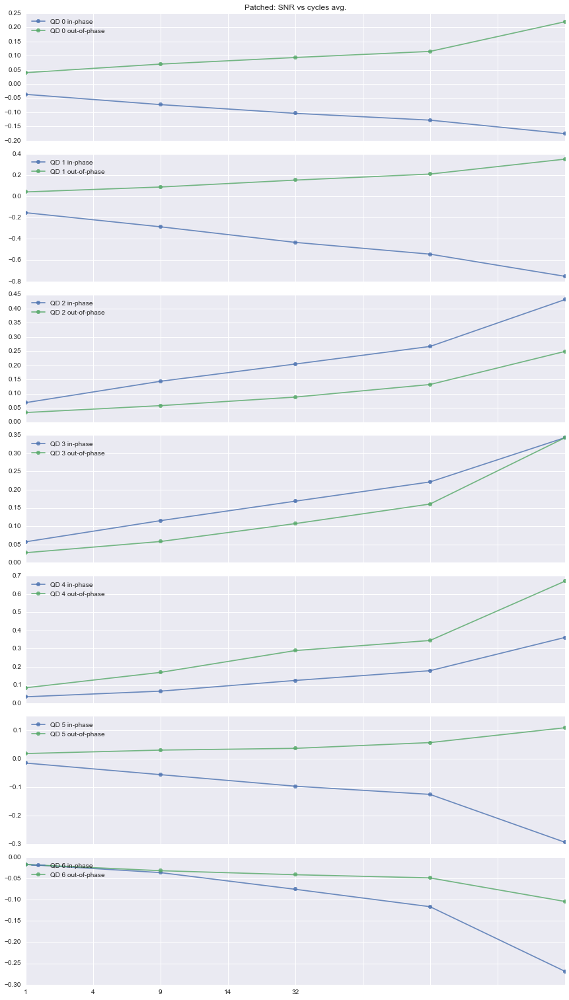

In [74]:
fig_patched

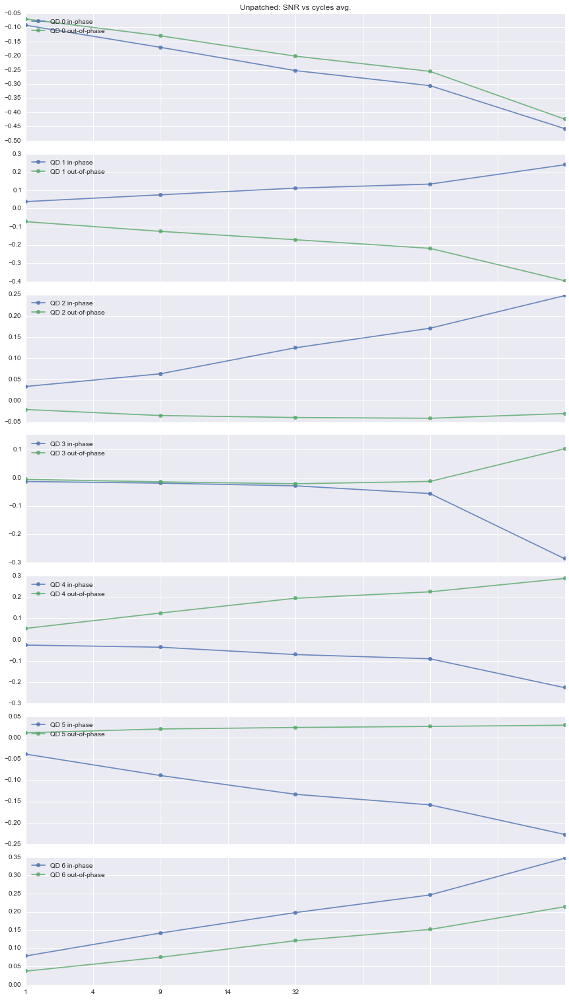

In [75]:
fig_unpatched

## Def. 2. Signal vs *n*-cycles

In [76]:
points_sel = points_patched
multi_ncycles = [2, 8, 18, 28, 64]
running_avg = True
clip_radius = 1.8
detrend_sigma = 300

n_alt_diff, n_alt_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}

for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        alt_diff = tt.edge_diff_all(timetrace_on, offset=0) 
        alt_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        n_alt_diff[ncycles].append(
            tt.avg_nsamples(alt_diff, num_samples=ncycles, running_avg=running_avg))
        n_alt_diffo[ncycles].append(
            tt.avg_nsamples(alt_diffo, num_samples=ncycles, running_avg=running_avg))
        
alpha = 0.8
name = 'SNR vs cycles avg.'
fig, ax = plt.subplots(len(points_sel), 1, 
                       figsize=(12, 3*len(points_sel)), sharex=True)
fig.tight_layout()
for ip, point in enumerate(points_sel):
    signal_cycle = [n_alt_diff[nc][ip].mean()/n_alt_diff[nc][ip].std() 
                    for nc in multi_ncycles]
    signal_cycleo = [n_alt_diffo[nc][ip].mean()/n_alt_diffo[nc][ip].std() 
                     for nc in multi_ncycles]
    ax[ip].plot(signal_cycle, '-o', ms=6, mew=0, label='QD %d in-phase' % ip, alpha=alpha)
    ax[ip].plot(signal_cycleo, '-o', ms=6, mew=0, label='QD %d out-of-phase' % ip, alpha=alpha)
    ax[ip].legend(loc='upper left')

ax[0].set_title('Patched: %s' % name)
ax[ip].set_xticklabels(multi_ncycles)
plt.close(fig)
fig_patched = fig;

In [77]:
points_sel = points_unpatched

n_alt_diff, n_alt_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}

for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        alt_diff = tt.edge_diff_all(timetrace_on, offset=0) 
        alt_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        n_alt_diff[ncycles].append(
            tt.avg_nsamples(alt_diff, num_samples=ncycles, running_avg=running_avg))
        n_alt_diffo[ncycles].append(
            tt.avg_nsamples(alt_diffo, num_samples=ncycles, running_avg=running_avg))
        
alpha = 0.8
name = 'SNR vs cycles avg.'
fig, ax = plt.subplots(len(points_sel), 1, 
                       figsize=(12, 3*len(points_sel)), sharex=True)
fig.tight_layout()
for ip, point in enumerate(points_sel):
    signal_cycle = [n_alt_diff[nc][ip].mean()/n_alt_diff[nc][ip].std() 
                    for nc in multi_ncycles]
    signal_cycleo = [n_alt_diffo[nc][ip].mean()/n_alt_diffo[nc][ip].std() 
                     for nc in multi_ncycles]
    ax[ip].plot(signal_cycle, '-o', ms=6, mew=0, label='QD %d in-phase' % ip, alpha=alpha)
    ax[ip].plot(signal_cycleo, '-o', ms=6, mew=0, label='QD %d out-of-phase' % ip, alpha=alpha)
    ax[ip].legend(loc='upper left')

ax[0].set_title('Unpatched: %s' % name)
ax[ip].set_xticklabels(multi_ncycles)
plt.close(fig)
fig_unpatched = fig;

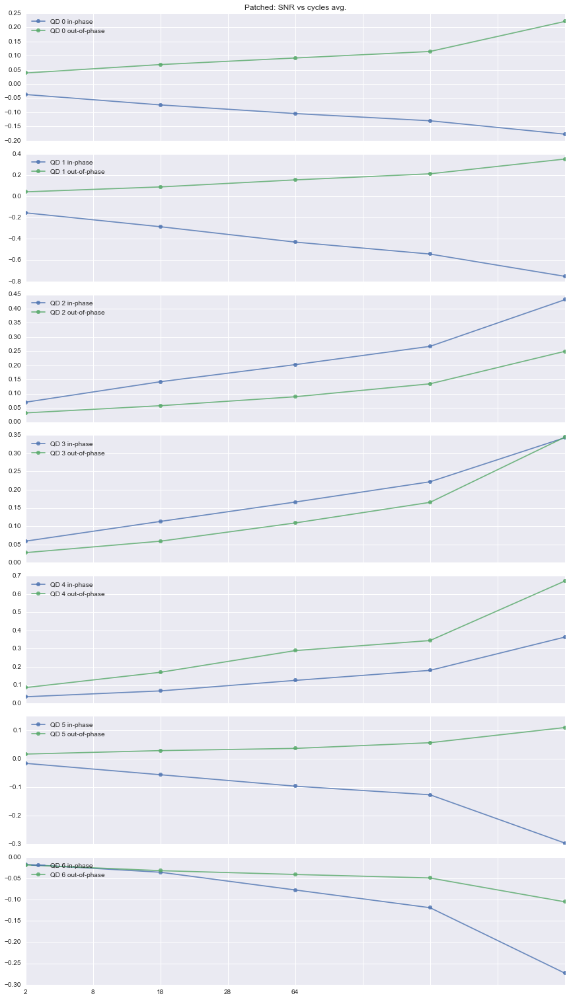

In [78]:
fig_patched

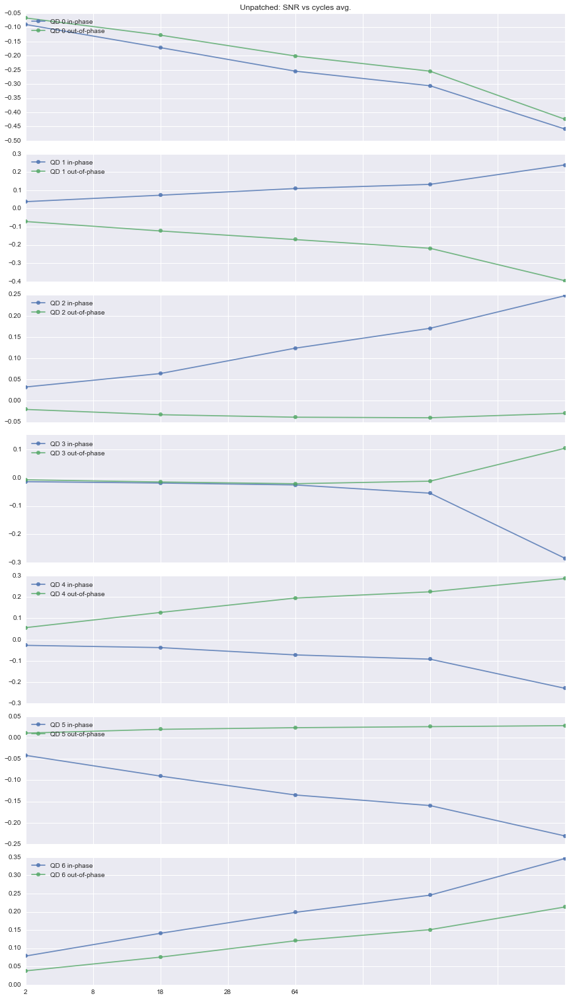

In [79]:
fig_unpatched

# All QD Means

In [80]:
points_sel = points_patched[:4] + points_patched[6:] # Remove duplicate QDs
multi_ncycles = range(5, 65, 5)
running_avg = True
clip_radius = 1.8
detrend_sigma = 300

n_alt_diff, n_alt_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}

for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        alt_diff = tt.edge_diff_all(timetrace_on, offset=0) 
        alt_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        n_alt_diff[ncycles].append(
            tt.avg_nsamples(alt_diff, num_samples=ncycles, running_avg=running_avg))
        n_alt_diffo[ncycles].append(
            tt.avg_nsamples(alt_diffo, num_samples=ncycles, running_avg=running_avg))

signal_cycle = np.zeros((len(points_sel), len(multi_ncycles)))
signal_cycleo = np.zeros((len(points_sel), len(multi_ncycles)))
for ip, point in enumerate(points_sel):
    signal_cycle[ip] = [n_alt_diff[nc][ip].mean()/n_alt_diff[nc][ip].std() 
                    for nc in multi_ncycles]
    signal_cycleo[ip] = [n_alt_diffo[nc][ip].mean()/n_alt_diffo[nc][ip].std() 
                     for nc in multi_ncycles]

alpha = 0.8
name = 'ALL QDs means: SNR vs cycles avg.'
fig, ax = plt.subplots(figsize=(8, 5))

ax.plot(multi_ncycles, np.abs(signal_cycle.mean(axis=0)), '-o', ms=6, mew=0, label='All QD in-phase', alpha=alpha)
ax.plot(multi_ncycles, np.abs(signal_cycleo.mean(axis=0)), '-o', ms=6, mew=0, label='All QD out-of-phase', alpha=alpha)
ax.legend(loc='upper left')

ax.set_title('Patched: %s' % name)
ax.set_xlabel('Number of cycles')
ax.set_ylim(0)
ax_patched = ax
plt.close(fig)
fig_patched = fig;

In [81]:
points_sel = points_unpatched

n_alt_diff, n_alt_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}

for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        alt_diff = tt.edge_diff_all(timetrace_on, offset=0) 
        alt_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        n_alt_diff[ncycles].append(
            tt.avg_nsamples(alt_diff, num_samples=ncycles, running_avg=running_avg))
        n_alt_diffo[ncycles].append(
            tt.avg_nsamples(alt_diffo, num_samples=ncycles, running_avg=running_avg))

signal_cycle = np.zeros((len(points_sel), len(multi_ncycles)))
signal_cycleo = np.zeros((len(points_sel), len(multi_ncycles)))
for ip, point in enumerate(points_sel):
    signal_cycle[ip] = [n_alt_diff[nc][ip].mean()/n_alt_diff[nc][ip].std() 
                    for nc in multi_ncycles]
    signal_cycleo[ip] = [n_alt_diffo[nc][ip].mean()/n_alt_diffo[nc][ip].std() 
                     for nc in multi_ncycles]

alpha = 0.8
name = 'ALL QDs means: SNR vs cycles avg.'
fig, ax = plt.subplots(figsize=(8, 5))

ax.plot(multi_ncycles, np.abs(signal_cycle.mean(axis=0)), '-o', ms=6, mew=0, label='All QD in-phase', alpha=alpha)
ax.plot(multi_ncycles, np.abs(signal_cycleo.mean(axis=0)), '-o', ms=6, mew=0, label='All QD out-of-phase', alpha=alpha)
ax.legend(loc='upper left')
ax.set_ylim(ax_patched.get_ylim())

ax.set_title('Unpatched: %s' % name)
ax.set_xlabel('Number of cycles')
plt.close(fig)
fig_unpatched = fig;

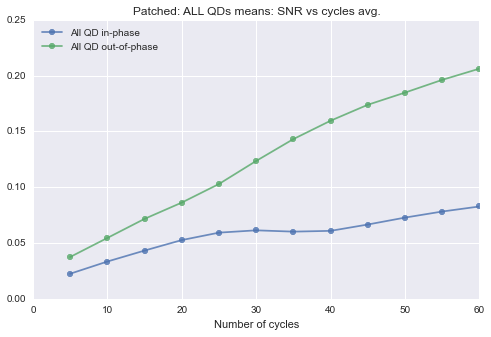

In [82]:
fig_patched

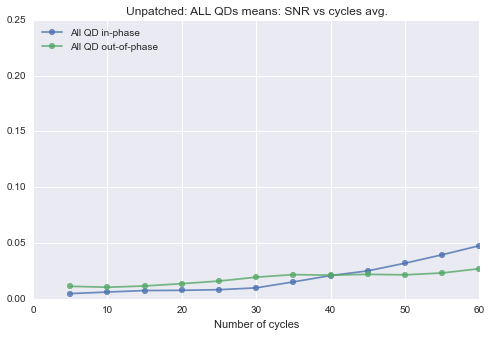

In [83]:
fig_unpatched

## Auto-correlation analysis

In [84]:
def acf(series):
    dseries = series - series.mean()
    full_size = 2*series.size - 1
    tau = np.arange(0, (full_size+1)/2)
    acf_full = np.correlate(dseries, dseries, mode='full')/(dseries*dseries).sum()
    assert acf_full[(full_size-1)/2:].size == (full_size+1)/2
    return tau, acf_full[(full_size-1)/2:]

In [85]:
points_sel = points_patched
clip_radius = 1.8
detrend_sigma = None

acf_res = []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace += 0.5*sim_signal
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    acf_res.append(acf(timetrace_on))

scales = [16, 64, 512]
fig, ax = plt.subplots(len(points_sel), len(scales), 
                       figsize=(4*len(scales), 3*len(points_sel)))
fig.tight_layout()
for ip, point in enumerate(points_sel):
    for cidx, ncrop in enumerate(scales):
        ax[ip, cidx].plot(acf_res[ip][0][:ncrop], acf_res[ip][1][:ncrop], '-o', mew=0, ms=6, 
                          color=colors[ip], label='QD %d' % ip)
        #ax[ip, cidx].set_yscale('log')
    ax[ip, -1].legend()
    ax[ip, 1].set_title('ACF Patched QD %d' % ip)
plt.close(fig)
fig_patched = fig;

In [86]:
points_sel = points_unpatched

acf_res = []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    acf_res.append(acf(timetrace_on))

scales = [16, 64, 512]
fig, ax = plt.subplots(len(points_sel), len(scales), 
                       figsize=(4*len(scales), 3*len(points_sel)))
fig.tight_layout()
for ip, point in enumerate(points_sel):
    for cidx, ncrop in enumerate(scales):
        ax[ip, cidx].plot(acf_res[ip][0][:ncrop], acf_res[ip][1][:ncrop], '-o', mew=0, ms=6, 
                          color=colors[ip], label='QD %d' % ip)
        #ax[ip, cidx].set_yscale('log')
    ax[ip, -1].legend()
    ax[ip, 1].set_title('ACF Unpatched QD %d' % ip)
plt.close(fig)
fig_unpatched = fig;

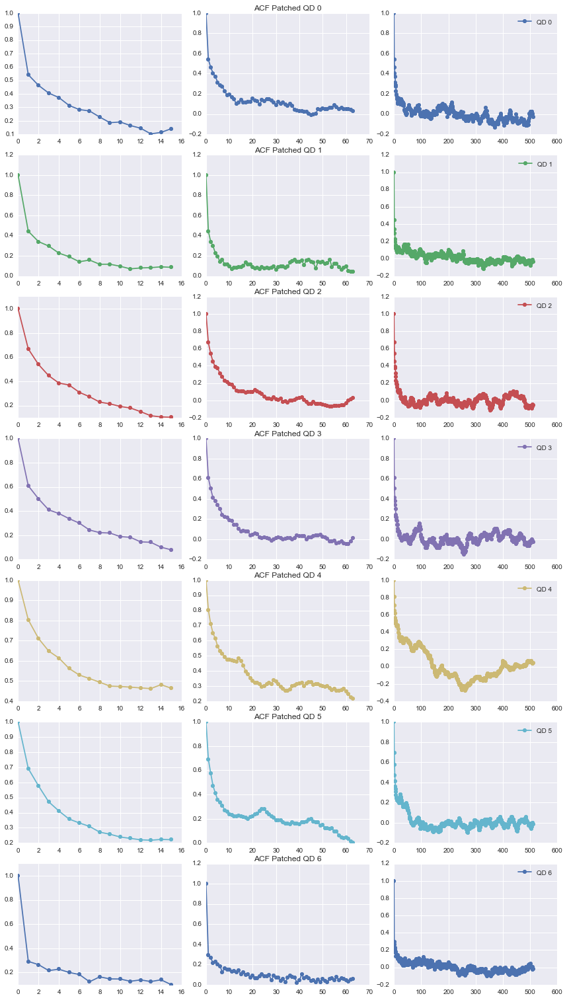

In [87]:
display(fig_patched)

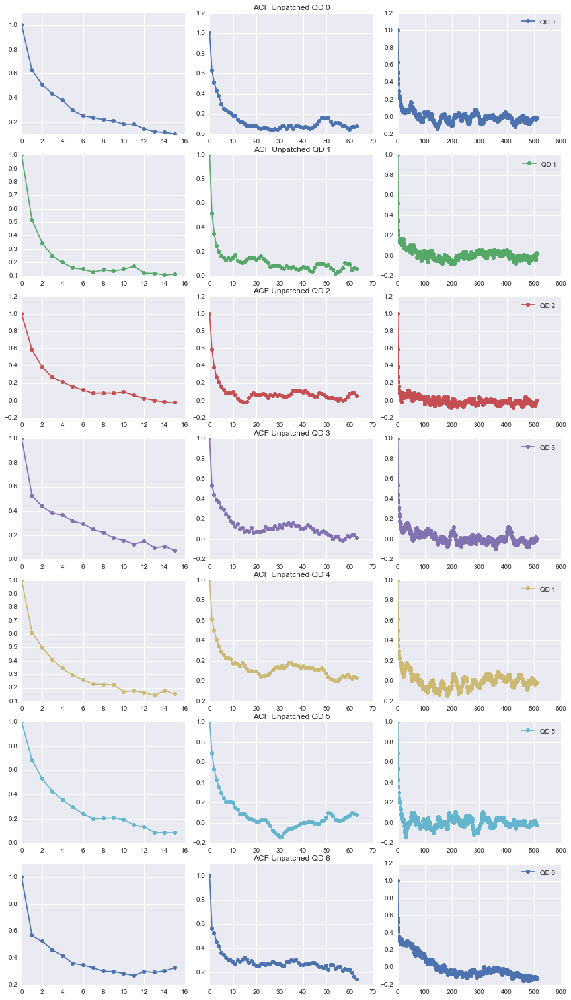

In [88]:
display(fig_unpatched)

## Cross-correlation with square wave

### On the meaning of correlating with a square wave

Let assume the "square wave" is a signal alternating between 1 and -1.

#### Very long square wave

If we correlate with a very long square wave, we basically get an alternation of 2 values: one when the wave is in-phase and one when the wave is out-of-phase. These are just the sum of all the ON periods **minus** the sum of all the OFF periods and *vice-versa*. Therefore these two values (in-pahse and out-of-phase) differ only in sign. We will extract this value for the different QD patched and unpached.

#### Very short square wave

If we correlate with a very short square wave, we basically do the same sum of ON periods **minus** OFF period samples (or vice-versa) in a small time window selected by the square wave as a function of the delay. A constant or slow-varying signal (compared to the square wave duration) will have a correlation of 0. A signal alternating in-phase will be positive for in-phase delays and negative for off-phase delays.

If the square wave has length $N$ the correlation is equivalent to the $N/2$-periods average performed on the first (*falling*) edge for in-phase delays and on the second (*rising*) edge for out-off-phase delays.

## CCF computation

Given the above consideration does not make sense to compute the classical CCF. The code below is just a stub for testing.

In [89]:
class SquareWave:
    def __init__(self):
        self.params = None
        self.sqwave = None
        
    def get(self, size, on_value, off_value):
        if (size, on_value, off_value) != self.params:
            self.sqwave = on_value*np.ones(size)
            self.sqwave[1::2] = off_value
        return self.sqwave
sqwave_gen = SquareWave()

def ccf_square(input_series, sqw_size, sqw_on_value, sqw_off_value):
    sqwave = sqwave_gen.get(sqw_size, sqw_on_value, sqw_off_value)
    dseries = input_series - input_series.mean()

    ccf_full = np.correlate(dseries, sqwave, mode='full')
    return ccf_full

In [90]:
points_sel = points_patched
sqw_size = 16

ccf_res = []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=2, detrend_sigma=None)
    timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    ccf_res.append(ccf_square(timetrace_on, sqw_size=sqw_size, sqw_on_value=1, sqw_off_value=-1))

scales = [64, 512, -1]
fig, ax = plt.subplots(len(points_sel), len(scales), 
                       figsize=(4*len(scales), 3*len(points_sel)))
fig.tight_layout()
for ip, point in enumerate(points_sel):
    for cidx, ncrop in enumerate(scales):
        ax[ip, cidx].plot(ccf_res[ip][:ncrop], '-o', mew=0, ms=6, 
                          color=colors[ip], label='QD %d' % ip)
        #ax[ip, cidx].set_yscale('log')
    ax[ip, -1].legend()
    ax[ip, 1].set_title('ACF Patched QD %d' % ip)
plt.close(fig)
fig_patched = fig;

In [91]:
points_sel = points_unpatched
sqw_size = 16

ccf_res = []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=2, detrend_sigma=None)
    timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    ccf_res.append(ccf_square(timetrace_on, sqw_size=sqw_size, sqw_on_value=1, sqw_off_value=-1))

scales = [64, 512, -1]
fig, ax = plt.subplots(len(points_sel), len(scales), 
                       figsize=(4*len(scales), 3*len(points_sel)))
fig.tight_layout()
for ip, point in enumerate(points_sel):
    for cidx, ncrop in enumerate(scales):
        ax[ip, cidx].plot(ccf_res[ip][:ncrop], '-o', mew=0, ms=6, 
                          color=colors[ip], label='QD %d' % ip)
        #ax[ip, cidx].set_yscale('log')
    ax[ip, -1].legend()
    ax[ip, 1].set_title('ACF Unpatched QD %d' % ip)
plt.close(fig)
fig_unpatched = fig;

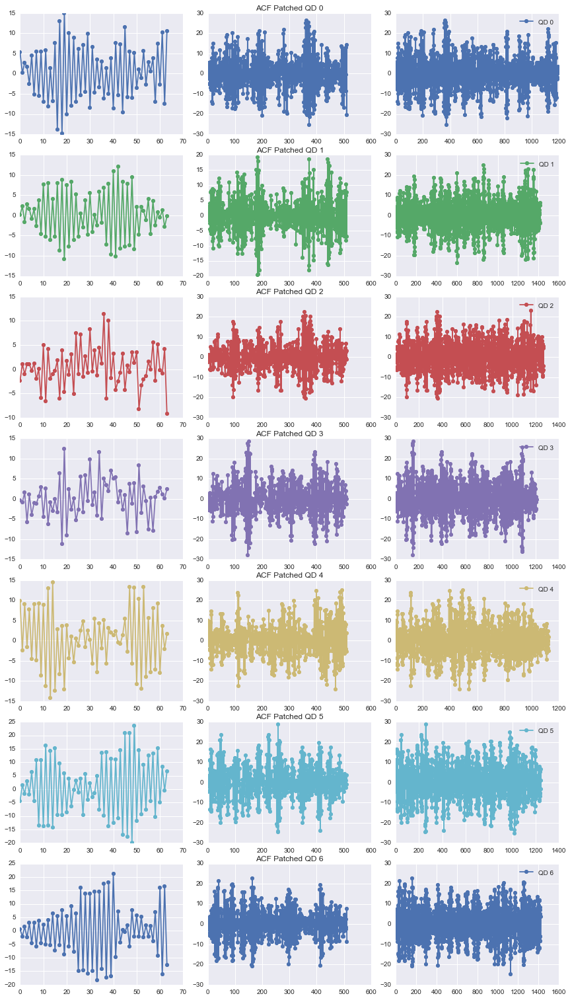

In [92]:
fig_patched

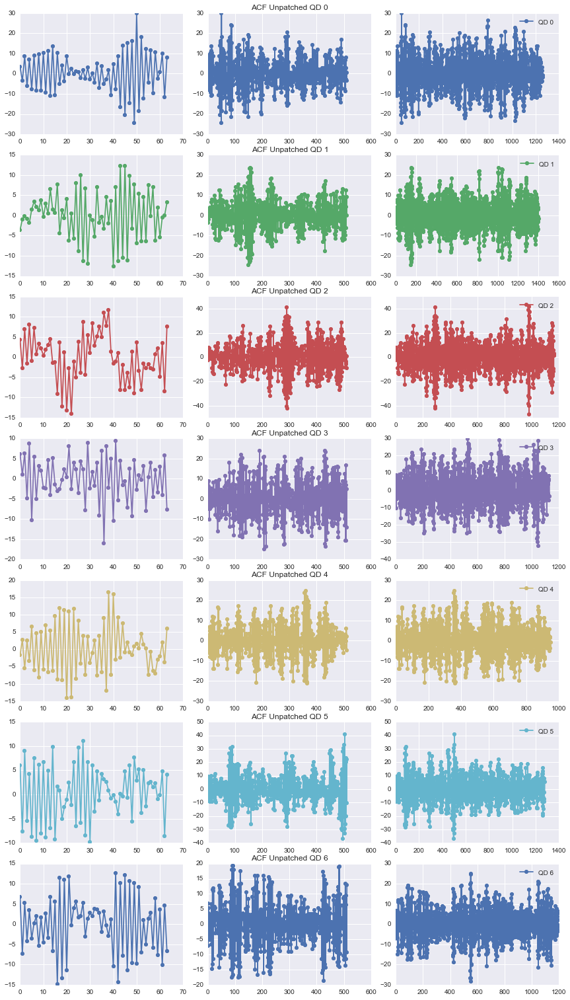

In [93]:
fig_unpatched

# Tests

In [94]:
tt.test_edge_diff(timetrace)